# Initialize

## Initialization

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
import tensorflow as tf
import tensorflow_probability as tfp
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpu_devices[0], True)
import re
import json
import sys
import random
import h5py
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.optimize import minimize, curve_fit, root
tfd=tfp.distributions
import pandas as pd
from timeit import default_timer as timer
from jupyterthemes import jtplot
jtplot.reset()
sys.path.append('../code')
import Bijectors,Distributions,Metrics,MixtureDistributions,Plotters,Trainer,Utils#,Lorentz
events_dir = "../ZplusJets/events/"
events_file = "../ZplusJets/events/precision_enthusiasts_dataset.h5"
events_dataset = "../ZplusJets/events/events.h5"
results_path = "../ZplusJets/results/Lorentz"

## Useful functions

In [2]:
def invariant_mass(four_momenta):
    """
    Computes the invariant mass from a tensor of four-momenta for each event.

    Parameters:
    four_momenta: Tensor of shape (n_events, 4*n_particles), the four-momenta of particles.

    Returns:
    Tensor of shape (n_events,), the invariant mass for each event.
    """
    # Reshape four_momenta to separate individual particle momenta
    momenta = tf.reshape(four_momenta, [-1, four_momenta.shape[1]//4, 4])

    # Sum over particles axis to get total energy and 3-momentum for each event
    total_energy = tf.reduce_sum(momenta[:, :, 0], axis=1)
    total_momentum = tf.reduce_sum(momenta[:, :, 1:], axis=1)

    # Compute the invariant mass
    mass_squared = total_energy**2 - tf.reduce_sum(total_momentum**2, axis=1)
    return tf.sqrt(tf.maximum(mass_squared, 0.0))

## Load and check events

###  Load and name components

In [58]:
import pandas as pd
df = pd.read_hdf(events_file, 'events')  # 'key' corresponds to the key you used when writing the file.
df = df.rename(columns={0: 'E_mu1',
                        1: 'px_mu1',
                        2: 'py_mu1',
                        3: 'pz_mu1',
                        4: 'E_mu2',
                        5: 'px_mu2',
                        6: 'py_mu2',
                        7: 'pz_mu2',
                        8: 'E_j1',
                        9: 'px_j1',
                        10: 'py_j1',
                        11: 'pz_j1',
                        12: 'E_j2',
                        13: 'px_j2',
                        14: 'py_j2',
                        15: 'pz_j2',
                        16: 'E_j3',
                        17: 'px_j3',
                        18: 'py_j3',
                        19: 'pz_j3'})
print("Imported",len(df),"events of Z+1,2,3j.")
df["E_cm"]=df["E_mu1"]+df["E_mu2"]+df["E_j1"]+df["E_j2"]+df["E_j3"]
df["px_cm"]=df["px_mu1"]+df["px_mu2"]+df["px_j1"]+df["px_j2"]+df["px_j3"]
df["py_cm"]=df["py_mu1"]+df["py_mu2"]+df["py_j1"]+df["py_j2"]+df["py_j3"]
df["pz_cm"]=df["pz_mu1"]+df["pz_mu2"]+df["pz_j1"]+df["pz_j2"]+df["pz_j3"]
df["M_inv"]=np.sqrt(df["E_cm"]**2-df["px_cm"]**2-df["py_cm"]**2-df["pz_cm"]**2)
#df_0 = df[(df['E_j1'] == 0) & (df['E_j2'] == 0) & (df['E_j3'] == 0)].copy()
df1 = df[(df['E_j1'] != 0) & (df['E_j2'] == 0) & (df['E_j3'] == 0)].copy()
df2 = df[(df['E_j1'] != 0) & (df['E_j2'] != 0) & (df['E_j3'] == 0)].copy()
df3 = df[(df['E_j1'] != 0) & (df['E_j2'] != 0) & (df['E_j3'] != 0)].copy()
print("There are",[len(df1),len(df2),len(df3)],"events of [Z+1j,Z+2j,Z+3j]. They have been split in three datasets.")

Imported 5413184 events of Z+1,2,3j.
There are [3987098, 1110182, 315904] events of [Z+1j,Z+2j,Z+3j]. They have been split in three datasets.


In [73]:
ascending=True
pd.set_option('display.max_colwidth', 100)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)
df

,E_mu1,px_mu1,py_mu1,pz_mu1,E_mu2,px_mu2,py_mu2,pz_mu2,E_j1,px_j1,py_j1,pz_j1,E_j2,px_j2,py_j2,pz_j2,E_j3,px_j3,py_j3,pz_j3,E_cm,px_cm,py_cm,pz_cm,M_inv
0,61.906208,47.608257,-10.776188,-38.075008,36.174904,-22.341436,-9.424344,26.845217,291.573975,-18.831652,27.458097,289.632385,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,389.655090,6.435169,7.257566,278.402588,272.450012
1,76.295212,51.591450,10.983278,-55.123943,50.302303,-32.333626,-23.460955,-30.568644,68.249321,-12.231569,30.145758,-59.624374,31.572071,-17.839846,-23.196199,-11.319241,0.000000,0.000000,0.000000,0.000000,226.418900,-10.813591,-5.528118,-156.636200,163.043335
2,57.087345,7.814155,-51.431320,-23.510067,34.107208,-13.943058,30.694582,5.170631,112.327835,1.140762,22.940464,109.894241,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,203.522385,-4.988141,2.203726,91.554810,181.684723
3,176.222855,-29.080029,-16.138800,-173.056015,1160.071411,-17.784439,-22.172791,-1159.723145,128.559647,35.689987,18.428099,-122.068893,147.305573,-24.116796,2.873557,145.220261,0.000000,0.000000,0.000000,0.000000,1612.159546,-35.291275,-17.009935,-1309.627808,939.360840
4,603.489990,36.736591,-12.078647,-602.249695,104.380554,-20.366482,24.431328,-99.416382,22.983244,22.762995,-2.040888,-1.300486,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,730.853760,39.133102,10.311793,-702.966553,195.825256
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55743,112.523659,24.635101,-41.604565,101.605835,38.860291,-33.293968,14.686932,13.635534,132.806595,11.260182,17.994991,-130.944427,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,284.190552,2.601315,-8.922642,-15.703056,283.604126
55744,1834.238281,1.647791,-103.082443,-1831.338745,102.152596,-19.287941,3.035860,-100.269196,178.490723,65.027649,33.441177,-162.789230,240.299057,-26.954819,8.165919,-238.639908,0.000000,0.000000,0.000000,0.000000,2355.180664,20.432678,-58.439487,-2333.037109,316.198517
55745,314.569000,9.959286,69.941628,-306.533264,18.912418,16.647638,3.257427,-8.362108,42.084568,-13.071302,-32.244484,-23.080492,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,375.565979,13.535622,40.954575,-337.975891,157.992386
55746,195.161636,-45.524384,16.086849,-189.094696,480.230072,-4.691292,-23.530190,-479.630341,73.153984,3.890539,37.378010,62.400257,298.785400,2.274149,-27.451210,-297.479584,108.968117,19.168037,10.982712,-106.652573,1156.299194,-24.882950,13.466171,-1010.456909,561.430481


In [48]:
df['px_tot'] = df[['px_mu1','px_mu2','px_j1']].sum(axis=1)
df['py_tot'] = df[['py_mu1','py_mu2','py_j1']].sum(axis=1)
df[['px_mu1','px_mu2','px_j1','px_tot','py_mu1','py_mu2','py_j1','py_tot']]

,px_mu1,px_mu2,px_j1,px_tot,py_mu1,py_mu2,py_j1,py_tot
0,47.608257,-22.341436,-18.831652,6.435169,-10.776188,-9.424344,27.458097,7.257566
1,51.591450,-32.333626,-12.231569,7.026255,10.983278,-23.460955,30.145758,17.668081
2,7.814155,-13.943058,1.140762,-4.988141,-51.431320,30.694582,22.940464,2.203726
3,-29.080029,-17.784439,35.689987,-11.174480,-16.138800,-22.172791,18.428099,-19.883493
4,36.736591,-20.366482,22.762995,39.133102,-12.078647,24.431328,-2.040888,10.311793
...,...,...,...,...,...,...,...,...
55743,24.635101,-33.293968,11.260182,2.601315,-41.604565,14.686932,17.994991,-8.922642
55744,1.647791,-19.287941,65.027649,47.387497,-103.082443,3.035860,33.441177,-66.605408
55745,9.959286,16.647638,-13.071302,13.535622,69.941628,3.257427,-32.244484,40.954575
55746,-45.524384,-4.691292,3.890539,-46.325138,16.086849,-23.530190,37.378010,29.934669


### Check 4-momentum conservation

In [165]:
muon1 = df[['E_mu1','px_mu1','py_mu1','pz_mu1']]
muon1['M']=None
muon1['M'] = np.sqrt(np.abs(df['E_mu1']**2-df['px_mu1']**2-df['py_mu1']**2-df['pz_mu1']**2))
len(muon1[muon1['M'] > muon1['E_mu1']/1000])
#np.all(muon1[:,0]**2-muon1[:,1]**2-muon1[:,2]**2-muon1[:,3]**2 < np.abs(np.min(muon1,axis=1)))

/tmp/ipykernel_327/49440600.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  muon1['M']=None
/tmp/ipykernel_327/49440600.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  muon1['M'] = np.sqrt(np.abs(df['E_mu1']**2-df['px_mu1']**2-df['py_mu1']**2-df['pz_mu1']**2))


0

In [110]:
muon2 = df[['E_mu2','px_mu2','py_mu2','pz_mu2']]
muon2['M']=None
muon2['M'] = np.sqrt(np.abs(df['E_mu2']**2-df['px_mu2']**2-df['py_mu2']**2-df['pz_mu2']**2))
len(muon2[muon2['M'] > muon2['E_mu2']/1000])

/tmp/ipykernel_327/3218335206.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  muon2['M']=None
/tmp/ipykernel_327/3218335206.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  muon2['M'] = np.sqrt(np.abs(df['E_mu2']**2-df['px_mu2']**2-df['py_mu2']**2-df['pz_mu2']**2))


0

In [114]:
j1 = df[['E_j1','px_j1','py_j1','pz_j1']]
j1['M']=None
j1['M'] = np.sqrt(np.abs(df['E_j1']**2-df['px_j1']**2-df['py_j1']**2-df['pz_j1']**2))
display(j1)
len(j1[j1['M'] > j1['E_j1']/2])

/tmp/ipykernel_327/3343528594.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j1['M']=None
/tmp/ipykernel_327/3343528594.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j1['M'] = np.sqrt(np.abs(df['E_j1']**2-df['px_j1']**2-df['py_j1']**2-df['pz_j1']**2))


,E_j1,px_j1,py_j1,pz_j1,M
0,291.573975,-18.831652,27.458097,289.632385,4.459015
1,68.249321,-12.231569,30.145758,-59.624374,6.672771
2,112.327835,1.140762,22.940464,109.894241,3.637640
3,128.559647,35.689987,18.428099,-122.068893,3.660254
4,22.983244,22.762995,-2.040888,-1.300486,2.054039
...,...,...,...,...,...
55743,132.806595,11.260182,17.994991,-130.944427,6.366876
55744,178.490723,65.027649,33.441177,-162.789230,3.419841
55745,42.084568,-13.071302,-32.244484,-23.080492,5.275989
55746,73.153984,3.890539,37.378010,62.400257,6.742509


0

In [115]:
j2 = df[['E_j2','px_j2','py_j2','pz_j2']]
j2['M']=None
j2['M'] = np.sqrt(np.abs(df['E_j2']**2-df['px_j2']**2-df['py_j2']**2-df['pz_j2']**2))
display(j2)
len(j2[j2['M'] > j2['E_j2']/2])

/tmp/ipykernel_327/1455975127.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j2['M']=None
/tmp/ipykernel_327/1455975127.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j2['M'] = np.sqrt(np.abs(df['E_j2']**2-df['px_j2']**2-df['py_j2']**2-df['pz_j2']**2))


,E_j2,px_j2,py_j2,pz_j2,M
0,0.000000,0.000000,0.000000,0.000000,0.000000
1,31.572071,-17.839846,-23.196199,-11.319241,3.513780
2,0.000000,0.000000,0.000000,0.000000,0.000000
3,147.305573,-24.116796,2.873557,145.220261,4.486742
4,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
55743,0.000000,0.000000,0.000000,0.000000,0.000000
55744,240.299057,-26.954819,8.165919,-238.639908,1.177590
55745,0.000000,0.000000,0.000000,0.000000,0.000000
55746,298.785400,2.274149,-27.451210,-297.479584,4.458138


0

In [116]:
j3 = df[['E_j3','px_j3','py_j3','pz_j3']]
j3['M']=None
j3['M'] = np.sqrt(np.abs(df['E_j3']**2-df['px_j3']**2-df['py_j3']**2-df['pz_j3']**2))
display(j3)
len(j3[j3['M'] > j3['E_j3']/2])

/tmp/ipykernel_327/86679044.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j3['M']=None
/tmp/ipykernel_327/86679044.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j3['M'] = np.sqrt(np.abs(df['E_j3']**2-df['px_j3']**2-df['py_j3']**2-df['pz_j3']**2))


,E_j3,px_j3,py_j3,pz_j3,M
0,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
55743,0.000000,0.000000,0.000000,0.000000,0.000000
55744,0.000000,0.000000,0.000000,0.000000,0.000000
55745,0.000000,0.000000,0.000000,0.000000,0.000000
55746,108.968117,19.168037,10.982712,-106.652573,3.353374


0

### Plots

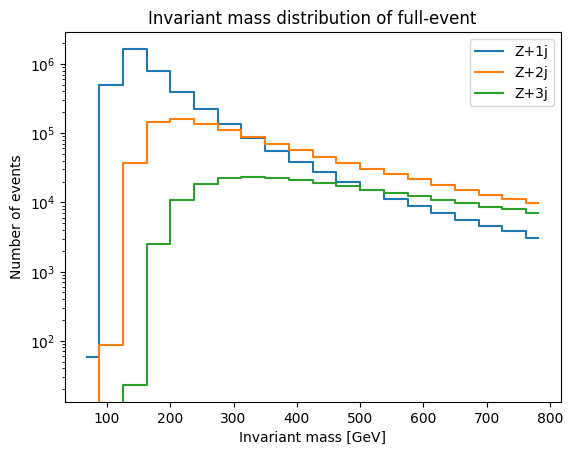

In [166]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(df_1["M_inv"], bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(df_2["M_inv"], bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(df_3["M_inv"], bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+3j', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

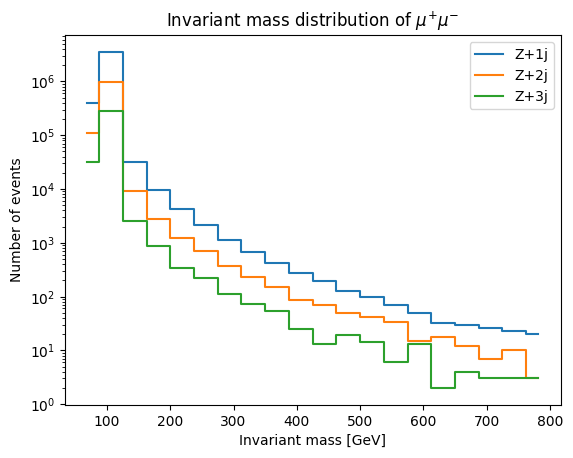

In [167]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

E_1=df1["E_mu1"]+df1["E_mu2"]
px_1=df1["px_mu1"]+df1["px_mu2"]
py_1=df1["py_mu1"]+df1["py_mu2"]
pz_1=df1["pz_mu1"]+df1["pz_mu2"]
M_inv_1=np.sqrt(E_1**2-px_1**2-py_1**2-pz_1**2)

E_2=df2["E_mu1"]+df2["E_mu2"]
px_2=df2["px_mu1"]+df2["px_mu2"]
py_2=df2["py_mu1"]+df2["py_mu2"]
pz_2=df2["pz_mu1"]+df2["pz_mu2"]
M_inv_2=np.sqrt(E_2**2-px_2**2-py_2**2-pz_2**2)

E_3=df3["E_mu1"]+df3["E_mu2"]
px_3=df3["px_mu1"]+df3["px_mu2"]
py_3=df3["py_mu1"]+df3["py_mu2"]
pz_3=df3["pz_mu1"]+df3["pz_mu2"]
M_inv_3=np.sqrt(E_3**2-px_3**2-py_3**2-pz_3**2)

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(M_inv_1, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(M_inv_2, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(M_inv_3, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+3j', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$')
plt.legend()
plt.show()

In [53]:
p_T_1

0         9.699675
2         5.453252
4        40.468910
6        58.969830
7        14.528968
           ...    
55740    12.180619
55742    14.831608
55743     9.294105
55745    43.133400
55747    27.820040
Length: 3987098, dtype: float32

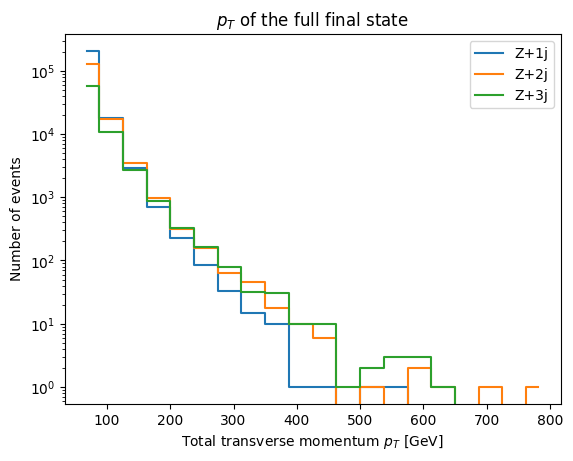

In [57]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

px_1=df1["px_mu1"]+df1["px_mu2"]+df1["px_j1"]
py_1=df1["py_mu1"]+df1["py_mu2"]+df1["py_j1"]
p_T_1=np.sqrt(px_1**2+py_1**2)

px_2=df2["px_mu1"]+df2["px_mu2"]+df2["px_j1"]+df2["px_j2"]
py_2=df2["py_mu1"]+df2["py_mu2"]+df2["py_j1"]+df2["py_j2"]
p_T_2=np.sqrt(px_2**2+py_2**2)

px_3=df3["px_mu1"]+df3["px_mu2"]+df3["px_j1"]+df3["px_j2"]+df3["px_j3"]
py_3=df3["py_mu1"]+df3["py_mu2"]+df3["py_j1"]+df3["py_j2"]+df3["py_j3"]
p_T_3=np.sqrt(px_3**2+py_3**2)

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(p_T_1, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(p_T_2, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(p_T_3, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+3j', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Total transverse momentum $p_{T}$ [GeV]')
plt.ylabel('Number of events')
plt.title('$p_{T}$ of the full final state')
plt.legend()
plt.show()

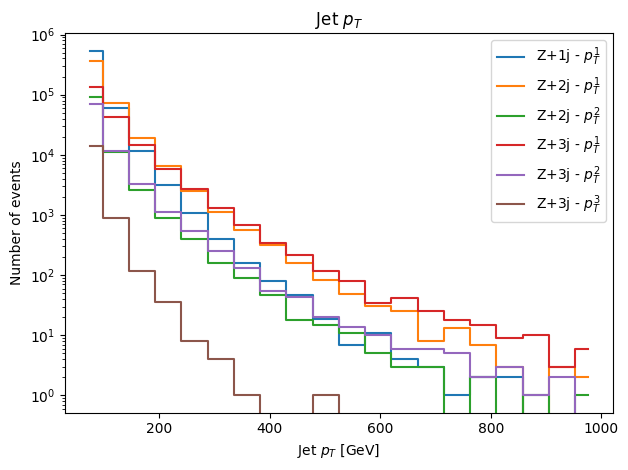

In [172]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 1000  # upper limit of the binning
num_bins = 20  # number of bins

pt1_1=np.sqrt(df1["px_j1"]**2+df1["py_j1"]**2)
pt2_1=np.sqrt(df2["px_j1"]**2+df2["py_j1"]**2)
pt2_2=np.sqrt(df2["px_j2"]**2+df2["py_j2"]**2)
pt3_1=np.sqrt(df3["px_j1"]**2+df3["py_j1"]**2)
pt3_2=np.sqrt(df3["px_j2"]**2+df3["py_j2"]**2)
pt3_3=np.sqrt(df3["px_j3"]**2+df3["py_j3"]**2)

# Create histogram values but do not plot it
counts1_1, _ = np.histogram(pt1_1, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2_1, _ = np.histogram(pt2_1, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2_2, _ = np.histogram(pt2_2, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3_1, _ = np.histogram(pt3_1, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3_2, _ = np.histogram(pt3_2, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3_3, bin_edges = np.histogram(pt3_3, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1_1, '-',label='Z+1j - $p_{T}^{1}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts2_1, '-',label='Z+2j - $p_{T}^{1}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts2_2, '-',label='Z+2j - $p_{T}^{2}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts3_1, '-',label='Z+3j - $p_{T}^{1}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts3_2, '-',label='Z+3j - $p_{T}^{2}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts3_3, '-',label='Z+3j - $p_{T}^{3}$', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Jet $p_{T}$ [GeV]')
plt.ylabel('Number of events')
plt.title('Jet $p_{T}$')
plt.legend()
plt.tight_layout()
plt.show()

### Define datasets

In [48]:
try:
    df1 = df1.drop(['E_j2', 'px_j2', 'py_j2', 'pz_j2', 
                    'E_j3', 'px_j3', 'py_j3', 'pz_j3',
                    'E_cm', 'px_cm', 'py_cm', 'pz_cm','M_inv'], axis=1)
except:
    pass
try:
    df2 = df2.drop(['E_j3', 'px_j3', 'py_j3', 'pz_j3',
                    'E_cm', 'px_cm', 'py_cm', 'pz_cm','M_inv'], axis=1)
except:
    pass
try:
    df3 = df3.drop(['E_cm', 'px_cm', 'py_cm', 'pz_cm','M_inv'], axis=1)
except:
    pass
print("Datasets have shapes",[df1.shape,df2.shape,df3.shape],".")
print("Converting datasets to Numpy")
np1 = df1.to_numpy()
np2 = df2.to_numpy()
np3 = df3.to_numpy()
print("Saving datasets to file",events_dataset)
with h5py.File(events_dataset, 'w') as hdf:
    # Save the datasets into the file with unique names
    hdf.create_dataset('Z+1j', data=np1)
    hdf.create_dataset('Z+2j', data=np2)
    hdf.create_dataset('Z+3j', data=np3)

Datasets have shapes [(3987098, 12), (1110182, 16), (315904, 20)] .
Converting datasets to Numpy
Saving datasets to file ../ZplusJets/events/events.h5


In [49]:
events_dataset_path = "../ZplusJets/events/events.h5"

In [193]:
with h5py.File(events_dataset, 'r') as hdf:
    # Save the datasets into the file with unique names
    events = hdf['Z+1j'][:]

In [194]:
X_data_train = events[:nsamples]

In [36]:
X_data_train = np.concatenate([events[:nsamples,i:i+3] for i in range(1, len(events[0]), 4)])

In [389]:
nsamples=100000
X_data_train = events[:nsamples]
#X_data_train = np.concatenate([events[:nsamples,i:i+3] for i in range(1, len(events[0]), 4)],axis=1)
mean = X_data_train.mean(axis=0)
std = X_data_train.std(axis=0)
X_data_train_std = (X_data_train - mean) / std
X_data_train_std

array([[-0.5894242 ,  1.0665622 , -0.23791106, ..., -0.64648056,
         0.92785245,  1.1443974 ],
       [-0.60182774,  0.17789881, -1.1471243 , ...,  0.03183496,
         0.77463955,  0.43494526],
       [ 0.80458534,  0.8237812 , -0.26703933, ...,  0.76618266,
        -0.0725887 , -0.00395623],
       ...,
       [ 0.05453667, -1.2828187 , -0.12128814, ...,  3.2950537 ,
        -0.8842407 , -0.6393789 ],
       [-0.03357847, -0.98983854,  1.259915  , ...,  0.00704609,
        -1.2973218 , -0.04632529],
       [ 0.21433435, -1.2540814 ,  0.3043262 , ...,  0.5228074 ,
        -0.8902129 , -0.08950322]], dtype=float32)

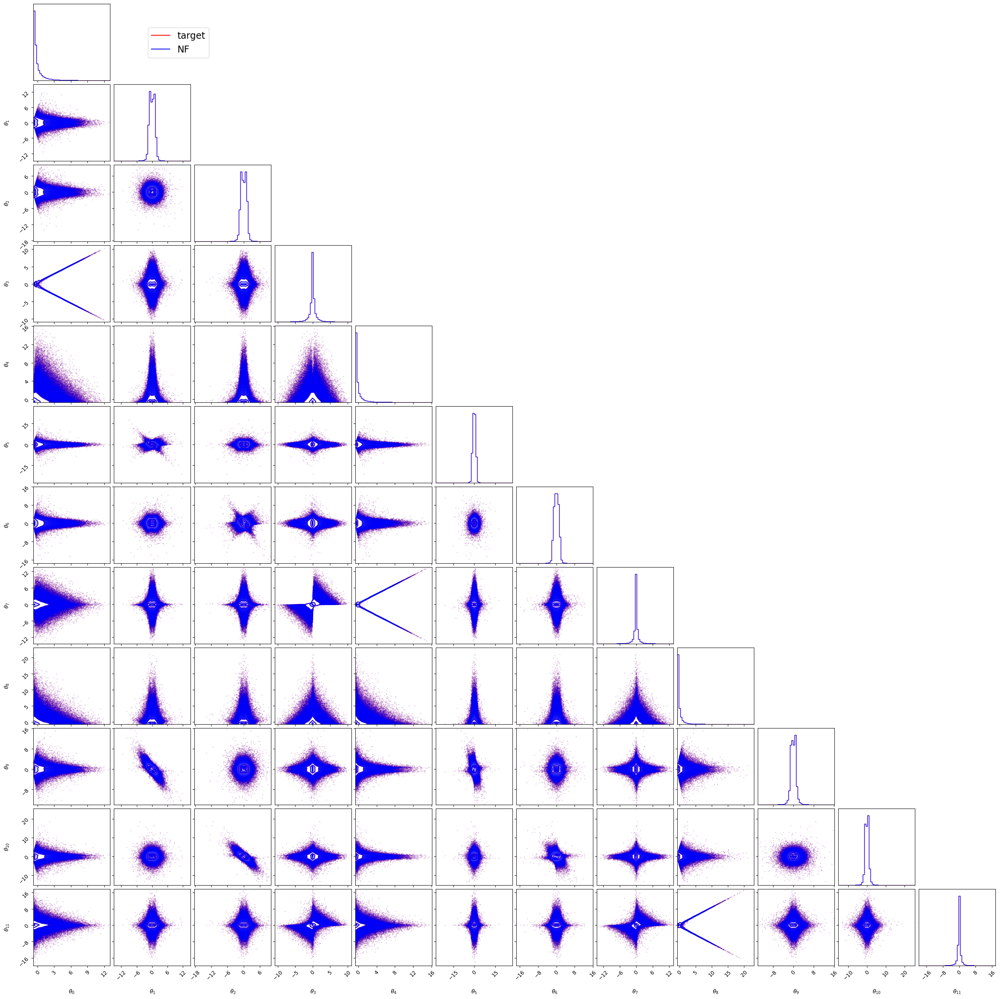

In [190]:
cornerplotter(X_data_train_std,X_data_train_std,max_dim=32)

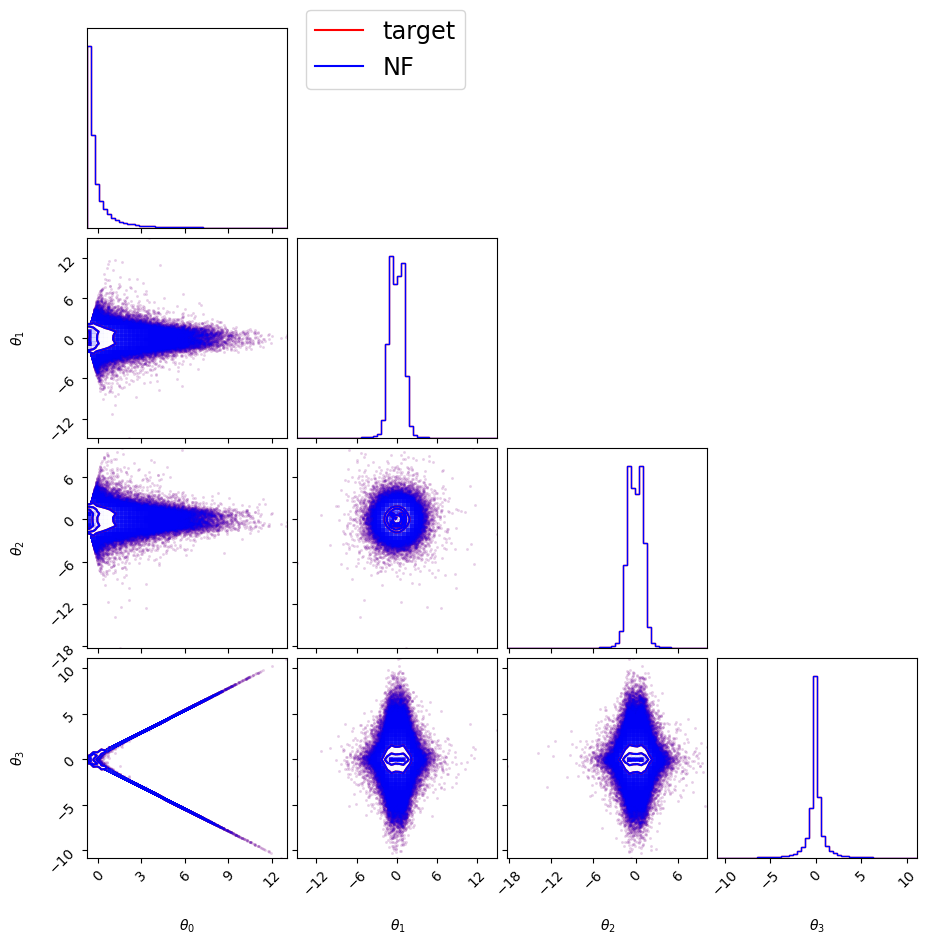

In [197]:
cornerplotter(X_data_train_std[:,:4],X_data_train_std[:,:4],max_dim=32)

##   Load data

In [2]:
with h5py.File(events_dataset, 'r') as hdf:
    # Loads the datasets from events_dataset file
    events = hdf['Z+1j'][:]
len(events)

3987098

In [3]:
nsamples=100000
X_data_train = events[:nsamples]
#X_data_train = np.concatenate([events[:nsamples,i:i+3] for i in range(1, len(events[0]), 4)],axis=1)
mean = X_data_train.mean(axis=0)
std = X_data_train.std(axis=0)
X_data_train_std = (X_data_train - mean) / std
X_data_train_std

array([[-0.5894242 ,  1.0665622 , -0.23791106, ..., -0.64648056,
         0.92785245,  1.1443974 ],
       [-0.60182774,  0.17789881, -1.1471243 , ...,  0.03183496,
         0.77463955,  0.43494526],
       [ 0.80458534,  0.8237812 , -0.26703933, ...,  0.76618266,
        -0.0725887 , -0.00395623],
       ...,
       [ 0.05453667, -1.2828187 , -0.12128814, ...,  3.2950537 ,
        -0.8842407 , -0.6393789 ],
       [-0.03357847, -0.98983854,  1.259915  , ...,  0.00704609,
        -1.2973218 , -0.04632529],
       [ 0.21433435, -1.2540814 ,  0.3043262 , ...,  0.5228074 ,
        -0.8902129 , -0.08950322]], dtype=float32)

# Lorents NFs

In [4]:
import numpy as np
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow_probability as tfp
import Lorentz

tfd = tfp.distributions
tfb = tfp.bijectors
tfpl = tfp.layers
tfk = tf.keras

## Pre-process data

In [6]:
with h5py.File(events_dataset, 'r') as hdf:
    # Loads the datasets from events_dataset file
    events = hdf['Z+1j'][:]
len(events)

3987098

In [7]:
nsamples=100000
X_data_train = tf.convert_to_tensor(events[:nsamples].astype(np.float32))
n_particles = int(X_data_train.shape[1]/4)
# Reshape the data to isolate the energies and momenta
reshaped_data = tf.reshape(X_data_train, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute mean energy
mean_energy = tf.reduce_mean(energies)
# Rescale all 4-momenta components by mean energy
X_data_train_std = X_data_train/mean_energy
###
###
# And now compute means3mom and stdev3mom
reshaped_data = tf.reshape(X_data_train_std, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute the means
mean_energy = tf.reduce_mean(energies)
mean_px = tf.reduce_mean(px)
mean_py = tf.reduce_mean(py)
mean_pz = tf.reduce_mean(pz)
# Compute the standard deviations
std_energy = tf.math.reduce_std(energies)
std_px = tf.math.reduce_std(px)
std_py = tf.math.reduce_std(py)
std_pz = tf.math.reduce_std(pz)
# Combine the means and standard deviations of px, py, and pz
means3mom = tf.stack([mean_px, mean_py, mean_pz], axis=-1)
stdev3mom = tf.stack([std_px, std_py, std_pz], axis=-1)

## Check the BaseDistribution

### Without transverse momentum conservation

In [9]:
base_dist64 = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom,conserve_transverse_momentum=False,dtype=tf.float64)
base_dist32 = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom,conserve_transverse_momentum=False,dtype=tf.float32)
samples64 = base_dist64.sample(100000)
samples32 = base_dist32.sample(100000)
#samples
log_probs64 = base_dist64.log_prob(samples64)
log_probs32 = base_dist32.log_prob(samples32)
[samples64,log_probs64,"\n",samples32,log_probs32]

[<tf.Tensor: shape=(100000, 12), dtype=float64, numpy=
 array([[ 1.4582453 ,  0.13495624, -0.37808991, ..., -0.04209488,
          0.08813658, -0.63696439],
        [ 1.46187283,  0.31208747, -0.06283689, ..., -0.05328096,
         -0.05162324, -1.51241005],
        [ 1.1513536 , -0.07655458,  0.11184432, ..., -0.09050676,
          0.10268046,  3.25217234],
        ...,
        [ 1.80093834, -0.0801295 , -0.02980692, ...,  0.02935502,
         -0.17333865,  0.55862961],
        [ 0.59273182, -0.27438358, -0.31852165, ..., -0.1627127 ,
          0.01861095, -0.85440783],
        [ 1.08717809,  0.07760547, -0.12570789, ...,  0.16756002,
         -0.05362511,  2.39142263]])>,
 <tf.Tensor: shape=(100000,), dtype=float64, numpy=
 array([-7.77936755, -2.24371484, -1.91630331, ..., -1.52067209,
        -3.60623123, -1.48763677])>,
 '\n',
 <tf.Tensor: shape=(100000, 12), dtype=float32, numpy=
 array([[ 0.54978967, -0.10679425, -0.0899014 , ..., -0.21377918,
         -0.01727225, -0.27754983],

In [10]:
Lorentz.check_4momentum_conservation(samples32[:5])

The event contains 5 particles
Checking energy-momentum conservation for each event...


{'event:0': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:1': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:2': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:3': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:4': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False}}

In [11]:
base_dist64.masses

<tf.Tensor: shape=(3,), dtype=float64, numpy=array([0., 0., 0.])>

In [12]:
Lorentz.compute_masses(samples64[:20])

The event contains 20 particles
Computing masses from on-shell condition


{'event:0': array([0., 0., 0.]),
 'event:1': array([0., 0., 0.]),
 'event:2': array([0., 0., 0.]),
 'event:3': array([0., 0., 0.]),
 'event:4': array([0., 0., 0.]),
 'event:5': array([0., 0., 0.]),
 'event:6': array([0., 0., 0.]),
 'event:7': array([0., 0., 0.]),
 'event:8': array([0., 0., 0.]),
 'event:9': array([0., 0., 0.]),
 'event:10': array([0., 0., 0.]),
 'event:11': array([0., 0., 0.]),
 'event:12': array([0., 0., 0.]),
 'event:13': array([0., 0., 0.]),
 'event:14': array([0., 0., 0.]),
 'event:15': array([0., 0., 0.]),
 'event:16': array([0., 0., 0.]),
 'event:17': array([0., 0., 0.]),
 'event:18': array([0., 0., 0.]),
 'event:19': array([0., 0., 0.])}

In [13]:
n_particles = int(X_data_train_std.shape[1]/4)
hidden_units = [128, 128, 128]
activation = 'relu'
num_bijectors = max(n_particles, len(hidden_units))

lorentz_transform_NN32 = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                    activation = activation,
                                                    dtype = "float32")
lorentz_transform_NN = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                  activation = activation,
                                                  dtype = tf.float64)

x32 = samples32[:5]
x = samples64[:5]

x_a = x[:, :4]
x_b = x[:, 4:]

parameters = lorentz_transform_NN(x_a) # shape: (n_samples, 6)
#print(parameters)
#parameters_expanded = tf.expand_dims(parameters, axis=1) # shape: (n_samples, 1, 6)
#parameters_extended = tf.tile(parameters_expanded, [1, n_particles, 1]) # shape: (n_samples, n_particles, 6)
beta_x = parameters[..., 0]  # Velocity for boost in the x direction (ranges from -1 to 1). shape (n_samples,)
beta_y = parameters[..., 1]  # Velocity for boost in the y direction (ranges from -1 to 1). shape (n_samples,)
beta_z = parameters[..., 2]  # Velocity for boost in the z direction (ranges from -1 to 1). shape (n_samples,)
theta_1 = parameters[..., 3]  # Euler angle 1: rotation around z-axis. shape (n_samples,)
theta_2 = parameters[..., 4]  # Euler angle 2: rotation around y-axis. shape (n_samples,)
theta_3 = parameters[..., 5]  # Euler angle 3: rotation around new z-axis. shape (n_samples,)

rotation = Lorentz.euler_rotation(theta_1, theta_2, theta_3)
boost = Lorentz.lorentz_boost(beta_x, beta_y, beta_z)

# Check unitarity and determinant of the boost matrix
print("\nChecking unitarity and determinant of the boost matrix")
# Identity tensor with the same shape
UUm1 = np.matmul(np.linalg.inv(boost.numpy()),boost.numpy())
detU = np.linalg.det(boost.numpy())
identity_tens = tf.eye(4, batch_shape=[UUm1.shape[0]], dtype=UUm1.dtype)
diff = UUm1-identity_tens
diff_det = detU-np.ones(len(detU))
max_diff = tf.reduce_max(tf.abs(diff)).numpy()
max_diff_det = tf.reduce_max(tf.abs(diff_det)).numpy()
print("The maximum value in the difference between identity matrices and U.U^{-1} is:", max_diff)
print("The determinants of Us are:", max_diff_det)

# Check unitarity and determinant of the rotation matrix
print("\nCheck unitarity and determinant of the rotation matrix")
# Identity tensor with the same shape
UUm1 = np.matmul(np.linalg.inv(rotation.numpy()),rotation.numpy())
detU = np.linalg.det(rotation.numpy())
identity_tens = tf.eye(4, batch_shape=[UUm1.shape[0]], dtype=UUm1.dtype)
diff = UUm1-identity_tens
diff_det = detU-np.ones(len(detU))
max_diff = tf.reduce_max(tf.abs(diff)).numpy()
max_diff_det = tf.reduce_max(tf.abs(diff_det)).numpy()
print("The maximum value in the difference between identity matrices and U.U^{-1} is:", max_diff)
print("The determinants of Us are:", max_diff_det)

print("\n=============================================\n")
print("\nFirst event before transformations:",x[0])
print("\nMasses before transformations:",Lorentz.compute_masses(x))
print("Check momentum conserations before transformations:", Lorentz.check_4momentum_conservation(x))
minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x,[5,3,4]),axis=1))
minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x,[5,3,4])[:,:2,:],axis=1))
print("\nTotal invariant mass before transformations is:", minv)
print("Invariant mass of muons before transformations is:", minv_mu)

#print("\n=============================================\n")
#print("\nApplying the boost")
#y_a_boosted = x_a
#y_b_boosted = Lorentz.apply_lorentz_transformation(x_b, boost)
#y_boosted = tf.concat([y_a_boosted, y_b_boosted], axis=-1)
#print("First event after boost:",y_boosted[0])
#print("\nMasses after the boost are:",Lorentz.compute_masses(y_boosted))
#print("Check momentum conserations after the boost:", Lorentz.check_4momentum_conservation(y_boosted))
#minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y_boosted,[5,3,4]),axis=1))
#minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y_boosted,[5,3,4])[:,:2,:],axis=1))
#print("\nTotal invariant mass before transformations is:", minv)
#print("Invariant mass of muons before transformations is:", minv_mu)
#
#print("\n=============================================\n")
#print("\nApplying also the rotation")
#y_a_boosted_rotated = y_a_boosted
#y_b_boosted_rotated = Lorentz.apply_lorentz_transformation(y_b_boosted, rotation)
#y_boosted_rotated = tf.concat([y_a_boosted_rotated, y_b_boosted_rotated], axis=-1)
#print("First event after boost and rotation:",y_boosted_rotated[0])
#print("\nMasses after the boost and the rotation are:",Lorentz.compute_masses(y_boosted_rotated))
#print("Check momentum conserations after the boost and the rotation are:", Lorentz.check_4momentum_conservation(y_boosted_rotated))
#minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y_boosted_rotated,[5,3,4]),axis=1))
#minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y_boosted_rotated,[5,3,4])[:,:2,:],axis=1))
#print("\nTotal invariant mass before transformations is:", minv)
#print("Invariant mass of muons before transformations is:", minv_mu)

print("\n=============================================\n")
print("\nApplying the full transformation")
y_a = x_a
y_b = Lorentz.lorentz_transform(x_b, beta_x, beta_y, beta_z, theta_1, theta_2, theta_3)
y = tf.concat([y_a, y_b], axis=-1)
print("First event after full transformation:",y[0])
print("\nMasses after the boost and the rotation are:",Lorentz.compute_masses(y))
print("Check momentum conserations after the boost and the rotation are:", Lorentz.check_4momentum_conservation(y))
minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y,[5,3,4]),axis=1))
minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y,[5,3,4])[:,:2,:],axis=1))
print("\nTotal invariant mass before transformations is:", minv)
print("Invariant mass of muons before transformations is:", minv_mu)

#print("\n=============================================\n")
#print("\nRotating back")
#x_a_boosted = y_a_boosted_rotated
#x_b_boosted = Lorentz.inverse_lorentz_transform(y_b, beta_x, beta_y, beta_z, theta_1, theta_2, theta_3)
#x_original = tf.concat([x_a_original, x_b_original], axis=-1)
#print("First event after boost and rotation:",y[0])
#print("\nMasses after the boost and the rotation are:",Lorentz.compute_masses(y))
#print("Check momentum conserations after the boost and the rotation are:", Lorentz.check_4momentum_conservation(y))
#minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y,[5,3,4]),axis=1))
#minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y,[5,3,4])[:,:2,:],axis=1))
#print("\nTotal invariant mass before transformations is:", minv)
#print("Invariant mass of muons before transformations is:", minv_mu)

print("\n=============================================\n")
print("\nApplying the inverse transformation")
x_a_original = y_a
x_b_original = Lorentz.inverse_lorentz_transform(y_b, beta_x, beta_y, beta_z, theta_1, theta_2, theta_3)
x_original = tf.concat([x_a_original, x_b_original], axis=-1)
print("First event back to original frame:",x_original[0])
print("\nMasses after the boost and the rotation are:",Lorentz.compute_masses(x_original))
print("Check momentum conserations after the boost and the rotation are:", Lorentz.check_4momentum_conservation(x_original))
minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x_original,[5,3,4]),axis=1))
minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x_original,[5,3,4])[:,:2,:],axis=1))
print("\nTotal invariant mass before transformations is:", minv)
print("Invariant mass of muons before transformations is:", minv_mu)


Checking unitarity and determinant of the boost matrix
The maximum value in the difference between identity matrices and U.U^{-1} is: 2.220446049250313e-16
The determinants of Us are: 4.440892098500626e-16

Check unitarity and determinant of the rotation matrix
The maximum value in the difference between identity matrices and U.U^{-1} is: 2.220446049250313e-16
The determinants of Us are: 1.1102230246251565e-16



First event before transformations: tf.Tensor(
[ 1.4582453   0.13495624 -0.37808991  1.40189664  1.69315553 -0.11193326
  0.48543044  1.61821009  0.64440955 -0.04209488  0.08813658 -0.63696439], shape=(12,), dtype=float64)
The event contains 5 particles
Computing masses from on-shell condition

Masses before transformations: {'event:0': array([0., 0., 0.]), 'event:1': array([0., 0., 0.]), 'event:2': array([0., 0., 0.]), 'event:3': array([0., 0., 0.]), 'event:4': array([0., 0., 0.])}
The event contains 5 particles
Checking energy-momentum conservation for each event...
Check m

### With transverse momentum conservation

In [14]:
base_dist64 = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom,conserve_transverse_momentum=True,dtype=tf.float64)
base_dist32 = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom,conserve_transverse_momentum=True,dtype=tf.float32)
samples64 = base_dist64.sample(100000)
samples32 = base_dist32.sample(100000)
#samples
log_probs64 = base_dist64.log_prob(samples64)
log_probs32 = base_dist32.log_prob(samples32)
[samples64,log_probs64,"\n",samples32,log_probs32]

[<tf.Tensor: shape=(100000, 12), dtype=float64, numpy=
 array([[ 0.76021623, -0.09992693, -0.103705  , ..., -0.11333691,
          0.15199097, -0.28098561],
        [ 1.0880032 , -0.01445992, -0.23541416, ...,  0.00467372,
          0.11748547, -1.98339774],
        [ 0.8976504 ,  0.36976924, -0.235392  , ..., -0.47974645,
          0.01078222,  0.26895392],
        ...,
        [ 0.66531866,  0.12821649, -0.06552663, ...,  0.13992466,
          0.1838074 ,  3.33055728],
        [ 0.78879567, -0.06184474, -0.10648934, ...,  0.11332398,
          0.02518439, -2.4466466 ],
        [ 0.40254516, -0.26353829, -0.2998955 , ...,  0.33591456,
          0.34236023, -0.04866845]])>,
 <tf.Tensor: shape=(100000,), dtype=float64, numpy=
 array([-2.32014378, -3.50147901, -5.82412272, ..., -4.78703731,
        -2.44191796, -4.63771933])>,
 '\n',
 <tf.Tensor: shape=(100000, 12), dtype=float32, numpy=
 array([[ 4.6350913e+00, -2.3565333e-01, -5.8208685e-02, ...,
          2.7848136e-01, -2.5662974e-01

In [15]:
Lorentz.check_4momentum_conservation(samples32[:5])

The event contains 5 particles
Checking energy-momentum conservation for each event...


{'event:0': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:1': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:2': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:3': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:4': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False}}

In [16]:
base_dist64.masses

<tf.Tensor: shape=(3,), dtype=float64, numpy=array([0., 0., 0.])>

In [17]:
Lorentz.compute_masses(samples64[:20])

The event contains 20 particles
Computing masses from on-shell condition


{'event:0': array([0., 0., 0.]),
 'event:1': array([0., 0., 0.]),
 'event:2': array([0., 0., 0.]),
 'event:3': array([0., 0., 0.]),
 'event:4': array([0., 0., 0.]),
 'event:5': array([0., 0., 0.]),
 'event:6': array([0., 0., 0.]),
 'event:7': array([0., 0., 0.]),
 'event:8': array([0., 0., 0.]),
 'event:9': array([0., 0., 0.]),
 'event:10': array([0., 0., 0.]),
 'event:11': array([0., 0., 0.]),
 'event:12': array([0., 0., 0.]),
 'event:13': array([0., 0., 0.]),
 'event:14': array([0., 0., 0.]),
 'event:15': array([0., 0., 0.]),
 'event:16': array([0., 0., 0.]),
 'event:17': array([0., 0., 0.]),
 'event:18': array([0., 0., 0.]),
 'event:19': array([0., 0., 0.])}

In [18]:
n_particles = int(X_data_train_std.shape[1]/4)
hidden_units = [128, 128, 128]
activation = 'relu'
num_bijectors = max(n_particles, len(hidden_units))

lorentz_transform_NN32 = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                    activation = activation,
                                                    dtype = "float32")
lorentz_transform_NN = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                  activation = activation,
                                                  dtype = tf.float64)

x32 = samples32[:5]
x = samples64[:5]

x_a = x[:, :4]
x_b = x[:, 4:]

parameters = lorentz_transform_NN(x_a) # shape: (n_samples, 6)
#print(parameters)
#parameters_expanded = tf.expand_dims(parameters, axis=1) # shape: (n_samples, 1, 6)
#parameters_extended = tf.tile(parameters_expanded, [1, n_particles, 1]) # shape: (n_samples, n_particles, 6)
beta_x = parameters[..., 0]  # Velocity for boost in the x direction (ranges from -1 to 1). shape (n_samples,)
beta_y = parameters[..., 1]  # Velocity for boost in the y direction (ranges from -1 to 1). shape (n_samples,)
beta_z = parameters[..., 2]  # Velocity for boost in the z direction (ranges from -1 to 1). shape (n_samples,)
theta_1 = parameters[..., 3]  # Euler angle 1: rotation around z-axis. shape (n_samples,)
theta_2 = parameters[..., 4]  # Euler angle 2: rotation around y-axis. shape (n_samples,)
theta_3 = parameters[..., 5]  # Euler angle 3: rotation around new z-axis. shape (n_samples,)

rotation = Lorentz.euler_rotation(theta_1, theta_2, theta_3)
boost = Lorentz.lorentz_boost(beta_x, beta_y, beta_z)

# Check unitarity and determinant of the boost matrix
print("\nChecking unitarity and determinant of the boost matrix")
# Identity tensor with the same shape
UUm1 = np.matmul(np.linalg.inv(boost.numpy()),boost.numpy())
detU = np.linalg.det(boost.numpy())
identity_tens = tf.eye(4, batch_shape=[UUm1.shape[0]], dtype=UUm1.dtype)
diff = UUm1-identity_tens
diff_det = detU-np.ones(len(detU))
max_diff = tf.reduce_max(tf.abs(diff)).numpy()
max_diff_det = tf.reduce_max(tf.abs(diff_det)).numpy()
print("The maximum value in the difference between identity matrices and U.U^{-1} is:", max_diff)
print("The determinants of Us are:", max_diff_det)

# Check unitarity and determinant of the rotation matrix
print("\nCheck unitarity and determinant of the rotation matrix")
# Identity tensor with the same shape
UUm1 = np.matmul(np.linalg.inv(rotation.numpy()),rotation.numpy())
detU = np.linalg.det(rotation.numpy())
identity_tens = tf.eye(4, batch_shape=[UUm1.shape[0]], dtype=UUm1.dtype)
diff = UUm1-identity_tens
diff_det = detU-np.ones(len(detU))
max_diff = tf.reduce_max(tf.abs(diff)).numpy()
max_diff_det = tf.reduce_max(tf.abs(diff_det)).numpy()
print("The maximum value in the difference between identity matrices and U.U^{-1} is:", max_diff)
print("The determinants of Us are:", max_diff_det)

print("\n=============================================\n")
print("\nFirst event before transformations:",x[0])
print("\nMasses before transformations:",Lorentz.compute_masses(x))
print("Check momentum conserations before transformations:", Lorentz.check_4momentum_conservation(x))
minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x,[5,3,4]),axis=1))
minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x,[5,3,4])[:,:2,:],axis=1))
print("\nTotal invariant mass before transformations is:", minv)
print("Invariant mass of muons before transformations is:", minv_mu)

#print("\n=============================================\n")
#print("\nApplying the boost")
#y_a_boosted = x_a
#y_b_boosted = Lorentz.apply_lorentz_transformation(x_b, boost)
#y_boosted = tf.concat([y_a_boosted, y_b_boosted], axis=-1)
#print("First event after boost:",y_boosted[0])
#print("\nMasses after the boost are:",Lorentz.compute_masses(y_boosted))
#print("Check momentum conserations after the boost:", Lorentz.check_4momentum_conservation(y_boosted))
#minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y_boosted,[5,3,4]),axis=1))
#minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y_boosted,[5,3,4])[:,:2,:],axis=1))
#print("\nTotal invariant mass before transformations is:", minv)
#print("Invariant mass of muons before transformations is:", minv_mu)
#
#print("\n=============================================\n")
#print("\nApplying also the rotation")
#y_a_boosted_rotated = y_a_boosted
#y_b_boosted_rotated = Lorentz.apply_lorentz_transformation(y_b_boosted, rotation)
#y_boosted_rotated = tf.concat([y_a_boosted_rotated, y_b_boosted_rotated], axis=-1)
#print("First event after boost and rotation:",y_boosted_rotated[0])
#print("\nMasses after the boost and the rotation are:",Lorentz.compute_masses(y_boosted_rotated))
#print("Check momentum conserations after the boost and the rotation are:", Lorentz.check_4momentum_conservation(y_boosted_rotated))
#minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y_boosted_rotated,[5,3,4]),axis=1))
#minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y_boosted_rotated,[5,3,4])[:,:2,:],axis=1))
#print("\nTotal invariant mass before transformations is:", minv)
#print("Invariant mass of muons before transformations is:", minv_mu)

print("\n=============================================\n")
print("\nApplying the full transformation")
y_a = x_a
y_b = Lorentz.lorentz_transform(x_b, beta_x, beta_y, beta_z, theta_1, theta_2, theta_3)
y = tf.concat([y_a, y_b], axis=-1)
print("First event after full transformation:",y[0])
print("\nMasses after the boost and the rotation are:",Lorentz.compute_masses(y))
print("Check momentum conserations after the boost and the rotation are:", Lorentz.check_4momentum_conservation(y))
minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y,[5,3,4]),axis=1))
minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y,[5,3,4])[:,:2,:],axis=1))
print("\nTotal invariant mass before transformations is:", minv)
print("Invariant mass of muons before transformations is:", minv_mu)

#print("\n=============================================\n")
#print("\nRotating back")
#x_a_boosted = y_a_boosted_rotated
#x_b_boosted = Lorentz.inverse_lorentz_transform(y_b, beta_x, beta_y, beta_z, theta_1, theta_2, theta_3)
#x_original = tf.concat([x_a_original, x_b_original], axis=-1)
#print("First event after boost and rotation:",y[0])
#print("\nMasses after the boost and the rotation are:",Lorentz.compute_masses(y))
#print("Check momentum conserations after the boost and the rotation are:", Lorentz.check_4momentum_conservation(y))
#minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y,[5,3,4]),axis=1))
#minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(y,[5,3,4])[:,:2,:],axis=1))
#print("\nTotal invariant mass before transformations is:", minv)
#print("Invariant mass of muons before transformations is:", minv_mu)

print("\n=============================================\n")
print("\nApplying the inverse transformation")
x_a_original = y_a
x_b_original = Lorentz.inverse_lorentz_transform(y_b, beta_x, beta_y, beta_z, theta_1, theta_2, theta_3)
x_original = tf.concat([x_a_original, x_b_original], axis=-1)
print("First event back to original frame:",x_original[0])
print("\nMasses after the boost and the rotation are:",Lorentz.compute_masses(x_original))
print("Check momentum conserations after the boost and the rotation are:", Lorentz.check_4momentum_conservation(x_original))
minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x_original,[5,3,4]),axis=1))
minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x_original,[5,3,4])[:,:2,:],axis=1))
print("\nTotal invariant mass before transformations is:", minv)
print("Invariant mass of muons before transformations is:", minv_mu)


Checking unitarity and determinant of the boost matrix
The maximum value in the difference between identity matrices and U.U^{-1} is: 2.220446049250313e-16
The determinants of Us are: 2.220446049250313e-16

Check unitarity and determinant of the rotation matrix
The maximum value in the difference between identity matrices and U.U^{-1} is: 2.220446049250313e-16
The determinants of Us are: 2.220446049250313e-16



First event before transformations: tf.Tensor(
[ 0.76021623 -0.09992693 -0.103705    0.74645067  0.21941593  0.21326384
 -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561], shape=(12,), dtype=float64)
The event contains 5 particles
Computing masses from on-shell condition

Masses before transformations: {'event:0': array([0., 0., 0.]), 'event:1': array([0., 0., 0.]), 'event:2': array([0., 0., 0.]), 'event:3': array([0., 0., 0.]), 'event:4': array([0., 0., 0.])}
The event contains 5 particles
Checking energy-momentum conservation for each event...
Check mo

### Plots

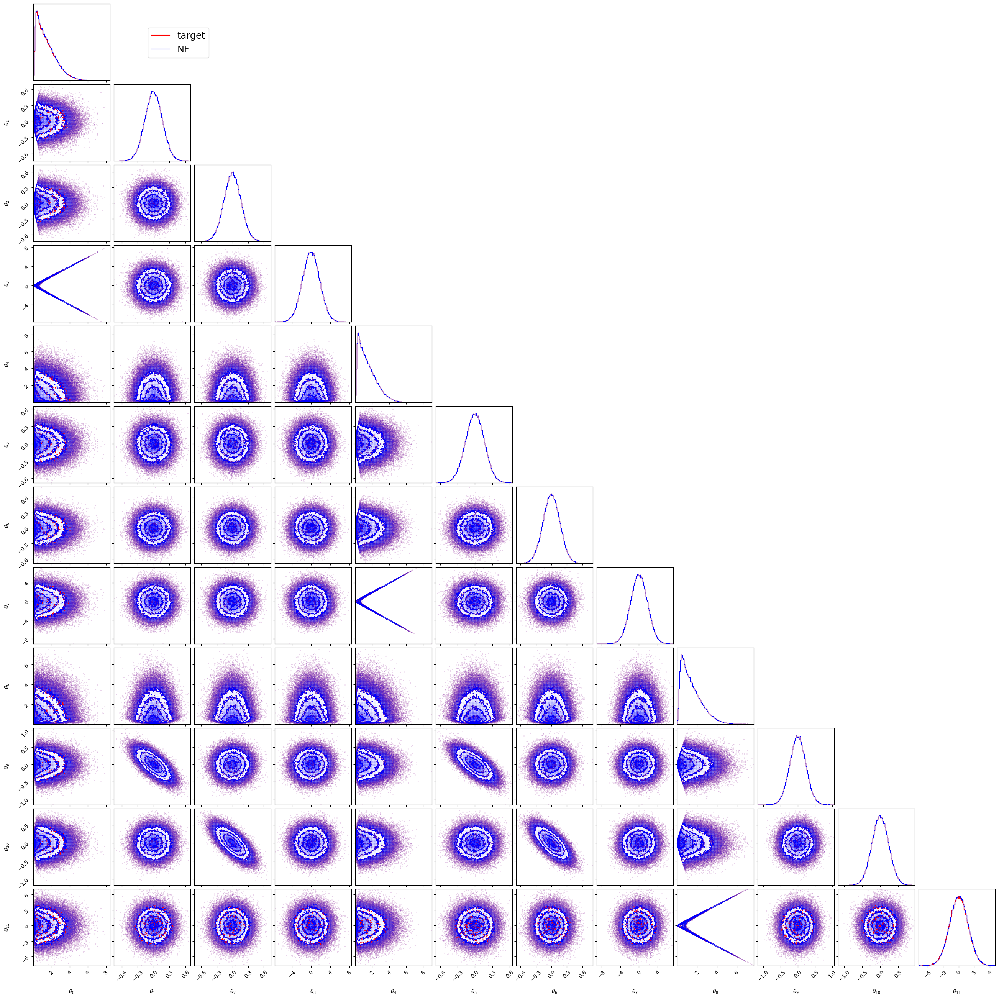

In [9]:
samples_np = samples.numpy()
Lorentz.cornerplotter(samples_np,samples_np,max_dim=32,n_bins=100)

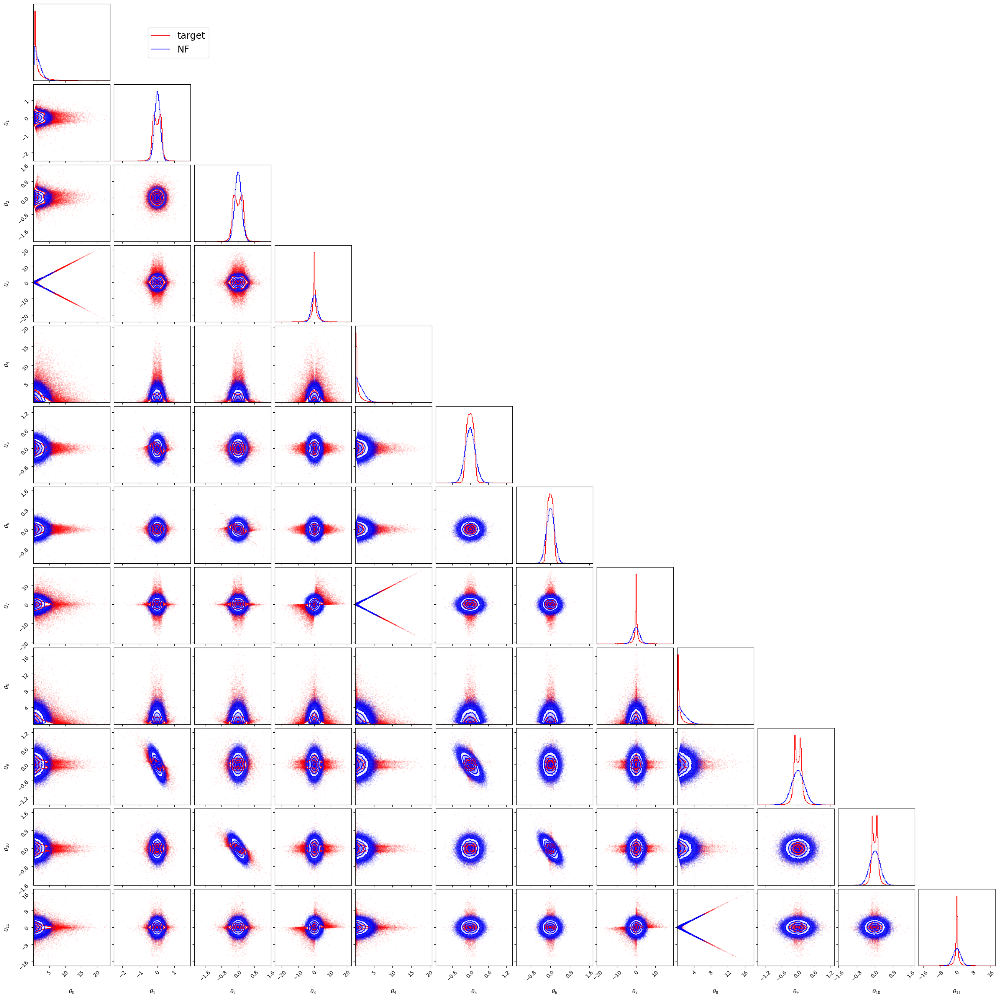

In [26]:
X_data_train_std_np = X_data_train_std.numpy()
Lorentz.cornerplotter(X_data_train_std_np,samples_np,max_dim=32,n_bins=100)

In [10]:
# Compute the total final state invariant mass
total_minv_true = invariant_mass(X_data_train_std*mean_energy)
total_minv_base = invariant_mass(samples*mean_energy)

# Compute the invariant mass of the first two particles
muons_minv_true = invariant_mass((X_data_train_std*mean_energy)[:, :8])
muons_minv_base = invariant_mass((samples*mean_energy)[:, :8])

In [11]:
total_minv_true

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([1.3277134 , 0.88539267, 0.95430243, ..., 2.3875809 , 1.1124071 ,
       0.8133743 ], dtype=float32)>

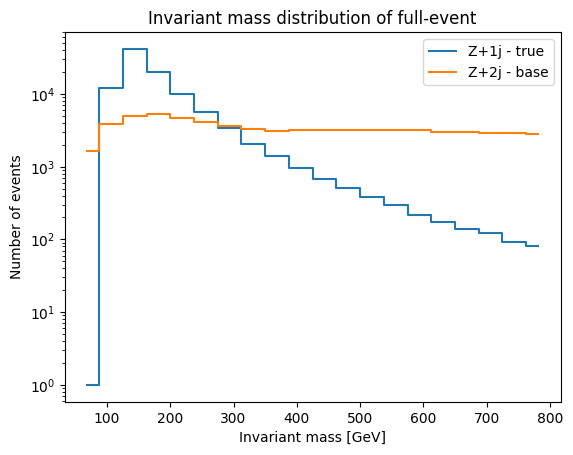

In [61]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(total_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(total_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - base', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

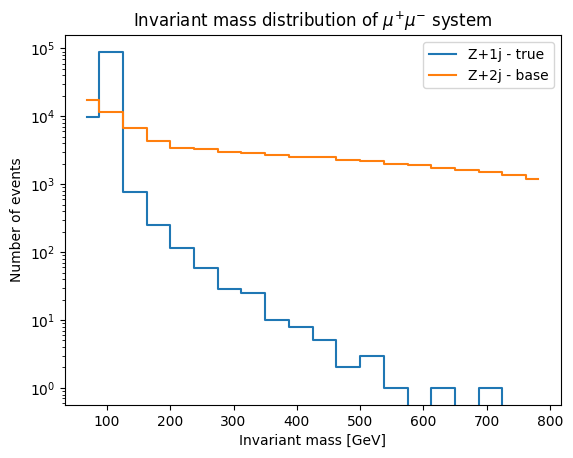

In [62]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(muons_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(muons_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - base', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$ system')
plt.legend()
plt.show()

## Build and check single bijector

In [22]:
n_particles = int(X_data_train_std.shape[1]/4)
hidden_units = [24, 24, 24]
activation = 'relu'
num_bijectors = max(n_particles, len(hidden_units))

lorentz_transform_NN = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                  activation = activation)
bijector = Lorentz.GeneralLorentzTransformBijector(n_particles = n_particles, 
                                                   lorentz_transform_NN = lorentz_transform_NN)

In [23]:
x = samples

x_reshaped = tf.reshape(x,[-1,3,4])
x_particle = x_reshaped[:, 0, :]  # Use the first particle's 4-momentum

parameters = lorentz_transform_NN(x_reshaped)
print(parameters)

tf.Tensor(
[[[-0.02021513  3.149875    3.163931    3.1591077   3.1142077
    3.1135306 ]
  [-0.48914728  3.6535742   3.2260718   3.3558726   2.3473141
    2.7829316 ]
  [-0.35896564  3.5013802   3.2025878   3.2884238   2.4849658
    2.851192  ]]

 [[ 0.08150694  3.15603     3.2303066   3.2301836   3.09538
    3.0361893 ]
  [-0.17051134  3.25475     3.1779563   3.1697276   2.9515471
    2.9921834 ]
  [-0.60025233  3.8831122   3.2888703   3.5935955   1.849568
    2.7672498 ]]

 [[ 0.18921985  3.144233    3.2830107   3.3343396   3.07903
    2.887814  ]
  [-0.52951497  3.7734153   3.2768722   3.5431774   2.0095105
    2.8304665 ]
  [-0.17643993  3.3627477   3.182731    3.3225822   2.703099
    3.0829554 ]]

 ...

 [[ 0.1842666   3.1705642   3.3081603   3.3780763   3.0541172
    2.8615234 ]
  [-0.10595255  3.2805064   3.1639946   3.2459338   2.8759296
    3.1041825 ]
  [-0.21670523  3.31535     3.1801808   3.1958125   2.8597007
    2.9666994 ]]

 [[ 0.18696268  3.1730063   3.3384228   3.346

In [24]:
Lorentz.compute_masses(x[0])

The event contains 12 particles
Computing masses from on-shell condition


{'event:0': array([nan, nan, nan], dtype=float32)}

In [25]:
base_dist = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom)

In [26]:
nf_dist = tfd.TransformedDistribution(base_dist,bijector)

In [16]:
samples = nf_dist.sample(100)
#samples
log_probs = nf_dist.log_prob(samples)
[samples,log_probs]

[<tf.Tensor: shape=(100, 12), dtype=float32, numpy=
 array([[ 3.82155061e-01,  2.79099613e-01,  2.51364380e-01, ...,
         -2.88759619e-01, -3.41618776e-01,  1.62343550e+00],
        [ 8.90619099e-01,  1.90411493e-01,  2.22514763e-01, ...,
         -6.98792100e-01, -1.07744895e-01,  2.96335125e+00],
        [ 2.04148102e+00,  6.26209080e-01,  5.09411618e-02, ...,
         -3.27611864e-01,  9.23510045e-02,  8.31093013e-01],
        ...,
        [ 2.22337174e+00,  1.11119300e-01, -1.16678059e-01, ...,
          1.80417433e-01,  5.32108359e-04,  9.21036780e-01],
        [ 2.01151514e+00,  3.06770593e-01,  3.01618636e-01, ...,
          1.88332781e-01, -3.46201122e-01, -5.14199018e-01],
        [ 9.62653458e-01,  1.74406856e-01,  3.19845080e-01, ...,
         -1.02166831e-01, -4.34291750e-01, -3.63742292e-01]], dtype=float32)>,
 <tf.Tensor: shape=(100,), dtype=float32, numpy=
 array([ -5.246894 ,  -5.88386  ,  -3.7166467,  -8.071373 ,  -7.033593 ,
         -4.0853124,  -2.548708 ,  -4.2

In [17]:
Lorentz.check_4momentum_conservation(samples[:5])

The event contains 5 particles
Checking energy-momentum conservation for each event...


{'event:0': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:1': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:2': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:3': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:4': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False}}

In [20]:
Lorentz.compute_squared_masses(samples[:10])

The event contains 10 particles
Computing squared masses from on-shell condition


{'event:0': array([-0.00461041, -0.6249223 , -0.32994533], dtype=float32),
 'event:1': array([-0.01116741,  0.00747985,  0.13558006], dtype=float32),
 'event:2': array([-0.29015136,  0.46876287,  0.05539954], dtype=float32),
 'event:3': array([ 0.6320181, -0.3190937, -0.6381359], dtype=float32),
 'event:4': array([-0.01949573, -0.00729865,  0.00914547], dtype=float32),
 'event:5': array([-6.411358 ,  0.0670947,  0.683713 ], dtype=float32),
 'event:6': array([-0.7380675 ,  1.1943204 ,  0.40268248], dtype=float32),
 'event:7': array([-0.16437134, -2.3237567 ,  0.4397403 ], dtype=float32),
 'event:8': array([ 0.10811728,  0.34400988, -0.11008328], dtype=float32),
 'event:9': array([-0.00332464,  0.01662536,  0.01286584], dtype=float32)}

### Plots

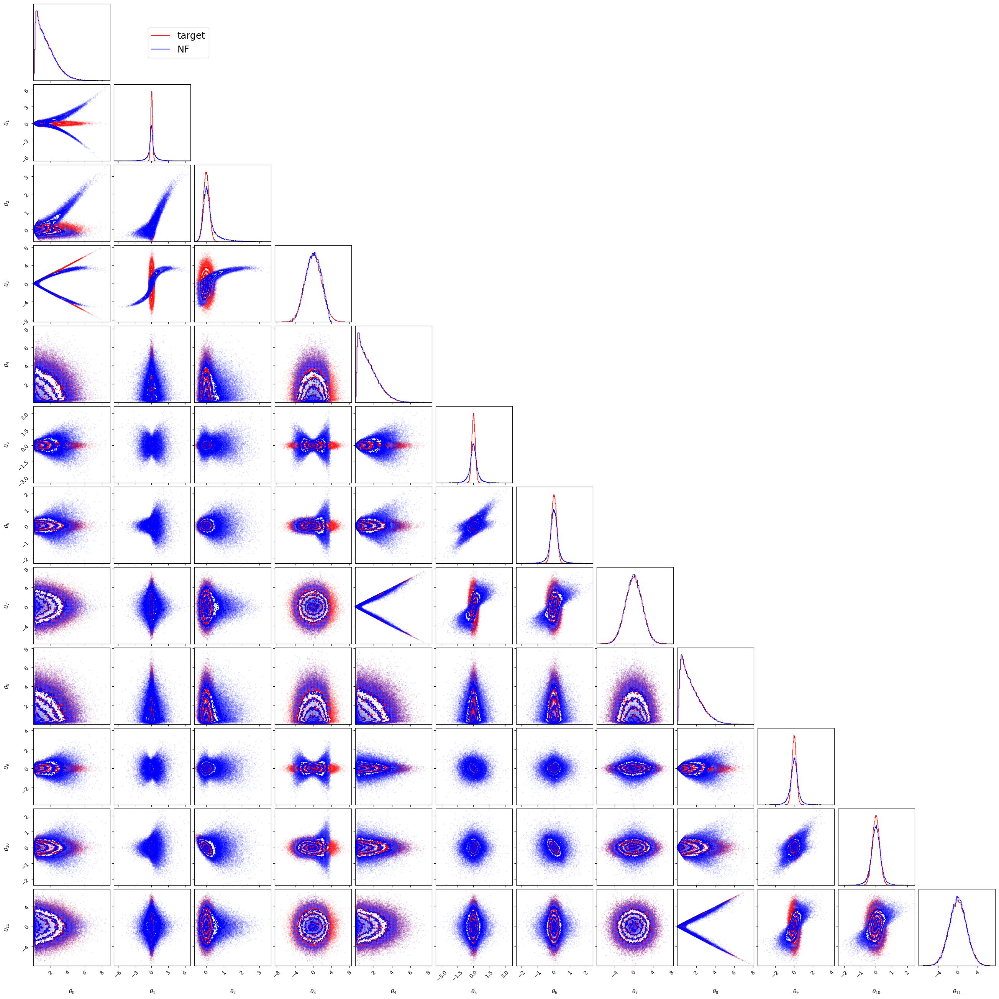

In [74]:
samples_np = samples.numpy()
x_forward_np = x_forward.numpy()
Lorentz.cornerplotter(samples_np,x_forward_np,max_dim=32,n_bins=100)

In [69]:
# Compute the total final state invariant mass
total_minv_forward = invariant_mass(x_forward*mean_energy).numpy()

# Compute the invariant mass of the first two particles
muons_minv_forward = invariant_mass((x_forward*mean_energy)[:, :8]).numpy()

In [68]:
total_minv_forward

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([885.20044, 963.7149 , 366.9284 , ..., 565.533  , 130.2464 ,
       641.33386], dtype=float32)>

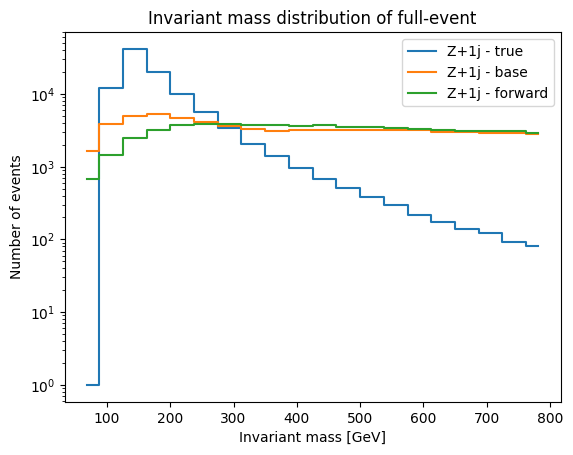

In [71]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(total_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(total_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(total_minv_forward, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+1j - base', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+1j - forward', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

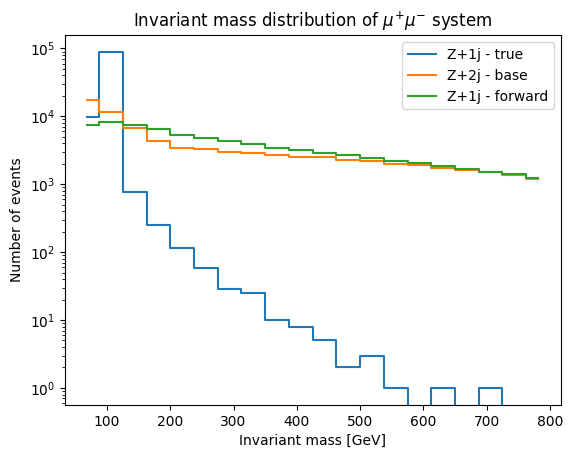

In [72]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(muons_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(muons_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(muons_minv_forward, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - base', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+1j - forward', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$ system')
plt.legend()
plt.show()

## Build the NF

In [19]:
n_particles = int(X_data_train_std.shape[1]/4)
hidden_units = [128, 128, 128]
activation = 'relu'
num_bijectors = max(n_particles, len(hidden_units))

lorentz_transform_NN = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                  activation = activation,
                                                  dtype = tf.float64)
bijector1 = Lorentz.GeneralLorentzTransformBijector(lorentz_transform_NN = lorentz_transform_NN)
bijector2 = Lorentz.MomentumCorrectionBijector()
bijector = tfb.Chain([bijector2, bijector1])

In [20]:
y1 = bijector1._forward(x)
print(Lorentz.check_4momentum_conservation(x[0:1]))
print(Lorentz.check_4momentum_conservation(y1[0:1]))
x1 = bijector1._inverse(y1)
print(x[0:1])
print(y1[0:1])
print(x1[0:1])
print(Lorentz.compute_masses(x[0:1]))
print(Lorentz.compute_masses(y1[0:1]))
print(Lorentz.compute_masses(x1[0:1]))

The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': True, 'momentum_y': True, 'momentum_z': False}}
The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': False, 'momentum_y': False, 'momentum_z': False}}
tf.Tensor(
[[ 0.76021623 -0.09992693 -0.103705    0.74645067  0.21941593  0.21326384
  -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561]], shape=(1, 12), dtype=float64)
tf.Tensor(
[[ 7.60216233e-01 -9.99269266e-02 -1.03704996e-01  7.46450671e-01
   2.27521646e-01 -2.24588139e-01 -3.64158444e-02 -3.92154999e-04
   3.30326466e-01  1.38044226e-01  1.29782793e-01  2.70584169e-01]], shape=(1, 12), dtype=float64)
tf.Tensor(
[[ 0.76021623 -0.09992693 -0.103705    0.74645067  0.21941593  0.21326384
  -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561]], shape=(1, 12), dtype=float64)
The event cont

In [21]:
y = bijector._forward(x)
print(Lorentz.check_4momentum_conservation(x[0:1]))
print(Lorentz.check_4momentum_conservation(y[0:1]))
x1 = bijector._inverse(y)
print(x[0:1])
print(y[0:1])
print(x1[0:1])
print(Lorentz.compute_masses(x[0:1]))
print(Lorentz.compute_masses(y[0:1]))
print(Lorentz.compute_masses(x1[0:1]))

The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': True, 'momentum_y': True, 'momentum_z': False}}
The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': True, 'momentum_y': True, 'momentum_z': False}}
tf.Tensor(
[[ 0.76021623 -0.09992693 -0.103705    0.74645067  0.21941593  0.21326384
  -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561]], shape=(1, 12), dtype=float64)
tf.Tensor(
[[ 7.57229054e-01  8.65439129e-02 -9.33669484e-02  7.46450671e-01
   2.27521646e-01 -2.24588139e-01 -3.64158444e-02 -3.92154999e-04
   3.30326466e-01  1.38044226e-01  1.29782793e-01  2.70584169e-01]], shape=(1, 12), dtype=float64)
tf.Tensor(
[[ 0.76021623 -0.09992693 -0.103705    0.74645067  0.21941593  0.21326384
  -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561]], shape=(1, 12), dtype=float64)
The event contai

In [22]:
print(x[0:1])
print(bijector2._forward(x[0:1]))
print(bijector2._inverse(bijector2._forward(x[0:1])))

tf.Tensor(
[[ 0.76021623 -0.09992693 -0.103705    0.74645067  0.21941593  0.21326384
  -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561]], shape=(1, 12), dtype=float64)
tf.Tensor(
[[ 0.76021623 -0.09992693 -0.103705    0.74645067  0.21941593  0.21326384
  -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561]], shape=(1, 12), dtype=float64)
tf.Tensor(
[[ 0.76021623  0.09992693  0.103705    0.74645067  0.21941593  0.21326384
  -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561]], shape=(1, 12), dtype=float64)


In [25]:
print(x[0:1])
print(bijector._forward(x[0:1]))
print(bijector._inverse(bijector._forward(x[0:1])))

tf.Tensor(
[[ 0.76021623 -0.09992693 -0.103705    0.74645067  0.21941593  0.21326384
  -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561]], shape=(1, 12), dtype=float64)
tf.Tensor(
[[ 7.57229054e-01  8.65439129e-02 -9.33669484e-02  7.46450671e-01
   2.27521646e-01 -2.24588139e-01 -3.64158444e-02 -3.92154999e-04
   3.30326466e-01  1.38044226e-01  1.29782793e-01  2.70584169e-01]], shape=(1, 12), dtype=float64)
tf.Tensor(
[[ 0.76021623 -0.09992693 -0.103705    0.74645067  0.21941593  0.21326384
  -0.04828597  0.01817554  0.33896818 -0.11333691  0.15199097 -0.28098561]], shape=(1, 12), dtype=float64)


In [11]:
# Debugging permutations
n_particles = int(X_data_train_std.shape[1]/4)
for i in range(10):
    n_bijectors = n_particles+i
    hidden_layers = [32, 32, 32]
    activation = 'relu'
    #num_bijectors = max(n_particles, len(hidden_layers))
    
    flow = Lorentz.GeneralLorentzNormalizingFlow(n_particles = n_particles, 
                                                 n_bijectors = n_bijectors, 
                                                 hidden_units = hidden_units, 
                                                 activation = activation,
                                                 permute_only = True)
    try:
        tf.debugging.assert_near(X_data_train_std, flow(X_data_train_std), atol=1e-06)
        print("n_bijectors = ",n_bijectors,"works.")
    except:
        print("n_bijectors = ",n_bijectors,"does not work.")

n_bijectors =  3 works.
n_bijectors =  4 works.
n_bijectors =  5 works.
n_bijectors =  6 works.
n_bijectors =  7 works.
n_bijectors =  8 works.
n_bijectors =  9 works.
n_bijectors =  10 works.
n_bijectors =  11 works.
n_bijectors =  12 works.


In [22]:
n_particles = X_data_train_std.shape[1]//4
n_bijectors = n_particles
hidden_layers = [32, 32, 32]
activation = 'relu'
flow = Lorentz.GeneralLorentzNormalizingFlow(n_particles = n_particles, 
                                             n_bijectors = n_bijectors, 
                                             hidden_units = hidden_units, 
                                             activation = activation,
                                             dtype = tf.float32,
                                             permute_only = False)

In [23]:
y = flow.forward(x)
print(Lorentz.check_4momentum_conservation(x[0:1]))
print(Lorentz.check_4momentum_conservation(y[0:1]))
x1 = flow.inverse(y)
print(x[0:1])
print(y[0:1])
print(x1[0:1])

The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': True, 'momentum_y': True, 'momentum_z': False}}
The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': True, 'momentum_y': True, 'momentum_z': False}}
tf.Tensor(
[[ 0.4493783  -0.0543911  -0.00800186  0.44600275  2.7531264   0.1589556
  -0.2422025  -2.7378416   1.8075352  -0.10456452  0.25020435 -1.7870779 ]], shape=(1, 12), dtype=float32)
tf.Tensor(
[[ 0.87055206 -0.7370417  -0.12211632  0.0282753   3.5971673   1.0908229
   1.1555812  -1.8159044   2.2306488  -0.35378122 -1.0334649  -1.3752422 ]], shape=(1, 12), dtype=float32)
tf.Tensor(
[[ 0.4493783  -0.0543911  -0.00800186  0.44600275  2.7531264   0.1589556
  -0.2422025  -2.7378416   1.8075352  -0.10456452  0.25020435 -1.7870779 ]], shape=(1, 12), dtype=float32)


In [16]:
# Apply forward transformation
x_forward = flow.flow.forward(x)
print(tf.shape(x_forward))

# Check if output shape matches input shape
assert x.shape == x_forward.shape, "Output shape does not match input shape in forward transformation."
#
## Apply inverse transformation
x_inverse = flow.flow.inverse(x_forward)
print(tf.shape(x_inverse))
#
# Check if the inverse of the forward transform matches the original input
assert tf.reduce_all(tf.abs(x - x_inverse) < 1e-6), "Inverse of forward transform does not match original input."

tf.Tensor([100000     12], shape=(2,), dtype=int32)
tf.Tensor([100000     12], shape=(2,), dtype=int32)


### Plots

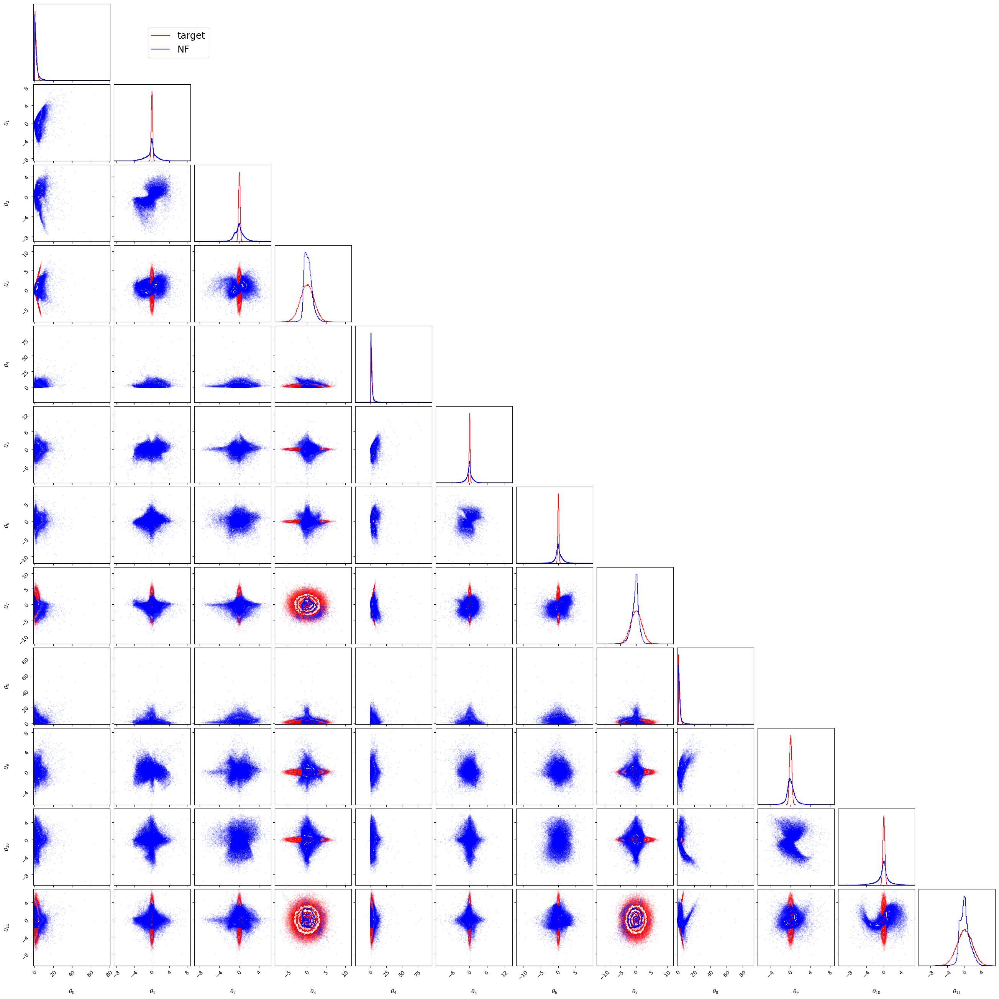

In [21]:
samples_np = samples.numpy()
x_forward_np = x_forward.numpy()
Lorentz.cornerplotter(samples_np,x_forward_np,max_dim=32,n_bins=100)

In [22]:
# Compute the total final state invariant mass
total_minv_forward = invariant_mass(x_forward*mean_energy).numpy()

# Compute the invariant mass of the first two particles
muons_minv_forward = invariant_mass((x_forward*mean_energy)[:, :8]).numpy()

In [23]:
total_minv_forward

array([4.9389997, 0.       , 4.326925 , ..., 4.1869583, 0.963303 ,
       5.5954947], dtype=float32)

In [24]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(total_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(total_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(total_minv_forward, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+1j - base', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+1j - forward', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

NameError: name 'total_minv_true' is not defined

In [ ]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(muons_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(muons_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(muons_minv_forward, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - base', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+1j - forward', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$ system')
plt.legend()
plt.show()

# Model C1 - 2*n_particles bijectors - [64,64,64] - no px=py=0 

Note: with no px,py conservation, float32, std_energy_0 normalization, normal means and stds, [64,64,64] NNs with GlorotUniform for 2*n_particles bijectors it trains for about 40 epochs before giving nans and the loss gets to ~-1.9. Corner plot starts to be decent, signaling that it is learning

In [4]:
import numpy as np
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow_probability as tfp
import Lorentz

tfd = tfp.distributions
tfb = tfp.bijectors
tfpl = tfp.layers
tfk = tf.keras

In [5]:
with h5py.File(events_dataset, 'r') as hdf:
    # Loads the datasets from events_dataset file
    events = hdf['Z+1j'][:]
len(events)

3987098

In [6]:
nsamples = 100000
ndims = events.shape[1]
X_data_train = tf.convert_to_tensor(events[:nsamples].astype(np.float32))
n_particles = int(X_data_train.shape[1]/4)
# Reshape the data to isolate the energies and momenta
reshaped_data = tf.reshape(X_data_train, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute mean energy
mean_energy_0 = tf.reduce_mean(energies)
median_energy_0 = tfp.stats.percentile(energies, 50.0)
max_energy_0 = tf.reduce_max(energies)
std_energy_0 = tf.math.reduce_std(energies)
# Rescale all 4-momenta components by mean energy
#X_data_train_std = X_data_train/mean_energy
#X_data_train_std = X_data_train/median_energy
#X_data_train_std = X_data_train/max_energy
X_data_train_std = X_data_train/(std_energy_0)
print("Energy_0 (mu,sigma) = ",[mean_energy_0.numpy(),std_energy_0.numpy()])
print("Energy_0 (median,max) = ",[median_energy_0.numpy(),max_energy_0.numpy()])
###
###
# And now compute means3mom and stdev3mom
reshaped_data = tf.reshape(X_data_train_std, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute the means
mean_energy = tf.reduce_mean(energies)
mean_px = tf.reduce_mean(px)
mean_py = tf.reduce_mean(py)
mean_pz = tf.reduce_mean(pz)
# Compute the standard deviations
std_energy = tf.math.reduce_std(energies)
std_px = tf.math.reduce_std(px)
std_py = tf.math.reduce_std(py)
std_pz = tf.math.reduce_std(pz)
# Combine the means and standard deviations of px, py, and pz
means3mom = tf.stack([mean_px, mean_py, mean_pz], axis=-1)
stdev3mom = tf.stack([std_px, std_py, std_pz], axis=-1)
print("Energy_std (mu,sigma) = ",[mean_energy.numpy(),std_energy.numpy()])
print("px_std (mu,sigma) = ",[mean_px.numpy(),std_px.numpy()])
print("py_std (mu,sigma) = ",[mean_py.numpy(),std_py.numpy()])
print("pz_std (mu,sigma) = ",[mean_pz.numpy(),std_pz.numpy()])

Energy_0 (mu,sigma) =  [205.20242, 309.13052]
Energy_0 (median,max) =  [91.29781, 4969.9326]
Energy_std (mu,sigma) =  [0.6638051, 1.0]
px_std (mu,sigma) =  [-4.809603e-05, 0.10849082]
py_std (mu,sigma) =  [-4.3594195e-05, 0.10840782]
pz_std (mu,sigma) =  [0.0008196925, 1.1903805]


In [7]:
base_dist = Lorentz.BaseDistribution4Momenta(n_particles=3,
                                             means3mom=means3mom,
                                             stdev3mom=stdev3mom,
                                             conserve_transverse_momentum=False,
                                             dtype=tf.float32)

In [8]:
samples = base_dist.sample(100000)
log_probs = base_dist.log_prob(samples)
loss_mean = -tf.reduce_mean(log_probs)
loss_max = -tf.reduce_max(log_probs)
[samples,log_probs]
print("A reasonable loss expected from training in range:",[loss_max.numpy(),loss_mean.numpy()])

[<tf.Tensor: shape=(100000, 12), dtype=float32, numpy=
 array([[ 2.0914524e+00, -3.6176398e-01,  6.0620601e-03, ...,
         -1.3169013e-01, -6.4841889e-02, -1.4258459e-03],
        [ 1.1269327e+00,  6.1647892e-02,  3.3298947e-02, ...,
          2.6556635e-02,  1.2600248e-01, -6.0660851e-01],
        [ 8.5773230e-01,  3.4028273e-02, -1.8775268e-01, ...,
         -9.5717616e-02, -4.3384772e-02, -1.4279923e+00],
        ...,
        [ 4.3875235e-01,  8.3615363e-02,  5.9422940e-02, ...,
          6.0666177e-02,  1.7936528e-01,  3.2044852e-01],
        [ 2.2390337e-01,  1.3425137e-01, -5.6933813e-02, ...,
          8.1944436e-02, -3.3727940e-02,  9.5327461e-01],
        [ 1.5762905e+00,  7.1996331e-02, -6.3019000e-02, ...,
          2.6129985e-01, -9.0048745e-02,  2.2816256e-01]], dtype=float32)>,
 <tf.Tensor: shape=(100000,), dtype=float32, numpy=
 array([-6.4760075,  2.0097313, -2.8100023, ...,  2.1944587,  0.0452261,
        -1.7259259], dtype=float32)>]

In [9]:
log_probs_samples = base_dist.log_prob(samples)
log_probs_data = base_dist.log_prob(X_data_train_std)
log_probs_samples_np = log_probs_samples.numpy()
log_probs_data_np = log_probs_data.numpy()

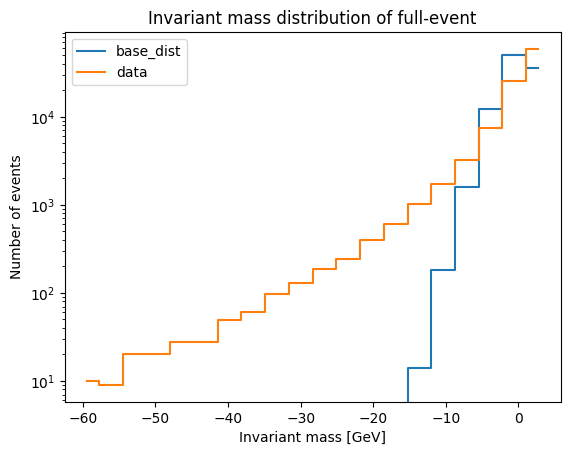

In [10]:
scale = 'log'
min_mass = np.min([np.min(log_probs_data_np),np.min(log_probs_samples_np)])/4  # lower limit of the binning
max_mass = np.max([np.max(log_probs_data_np),np.max(log_probs_samples_np)])  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(log_probs_samples_np, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(log_probs_data_np, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='base_dist', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='data', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

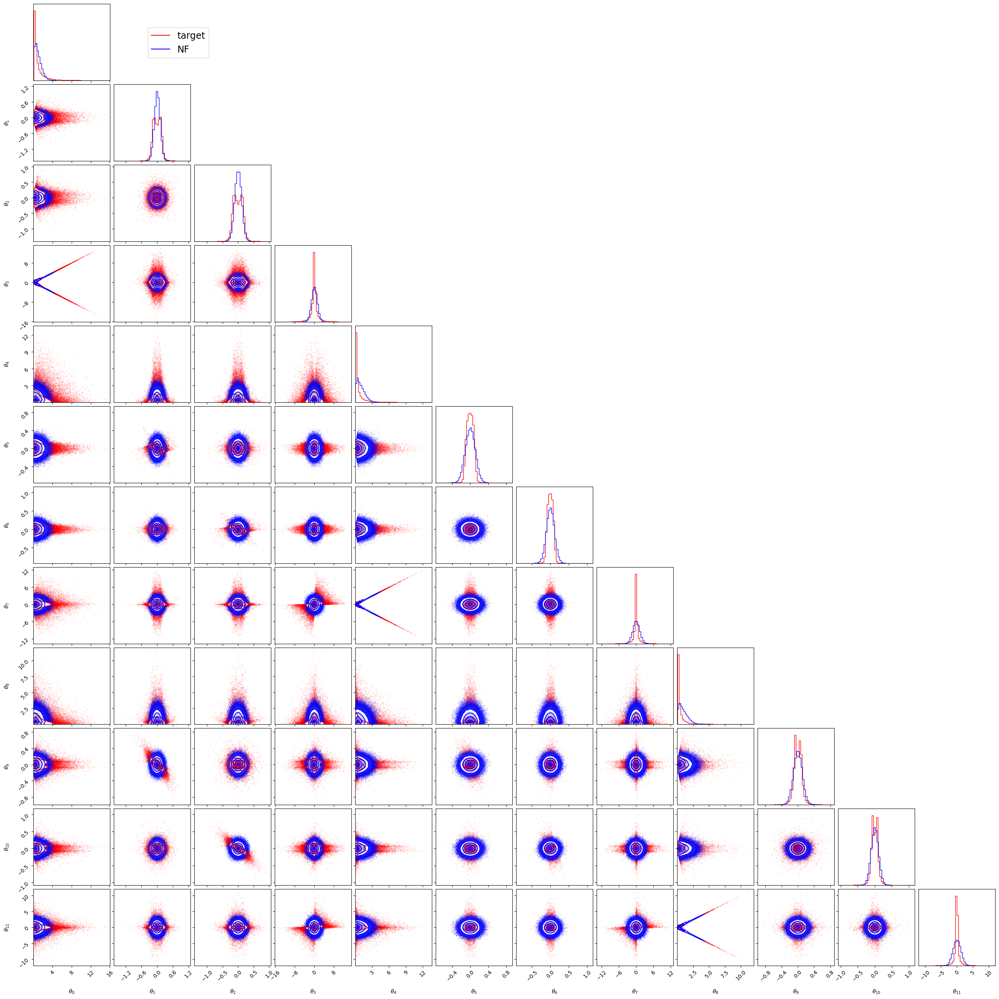

In [11]:
samples_np = samples.numpy().astype("float32")
samples_np_no_nans = samples_np[~np.isnan(samples_np).any(axis=1), :]
X_data_train_std_np = X_data_train_std.numpy().astype("float32")
X_data_train_std_np_no_nans = X_data_train_std_np[~np.isnan(X_data_train_std_np).any(axis=1), :]
Lorentz.cornerplotter(X_data_train_std_np,samples_np_no_nans,max_dim=32,n_bins=50)

In [12]:
prova = base_dist.log_prob(X_data_train_std)
print(prova)
# Check for NaNs
has_nan = tf.math.is_nan(prova)
# Count the number of NaNs
num_nans = tf.math.reduce_sum(tf.cast(has_nan, tf.int32))
# Print the result
print("Number of NaNs: ", num_nans.numpy())

tf.Tensor(
[ 2.4041743   2.5434866   1.8106437  ... -1.9121575   0.74970865
  1.3094423 ], shape=(100000,), dtype=float32)
Number of NaNs:  0


In [13]:
n_particles = X_data_train_std.shape[1]//4
n_bijectors = 2*n_particles
hidden_units = [64, 64, 64]
activation = 'relu'

flow = Lorentz.GeneralLorentzNormalizingFlow(n_particles = n_particles, 
                                             n_bijectors = n_bijectors, 
                                             hidden_units = hidden_units, 
                                             activation = activation,
                                             conserve_transverse_momentum=False,
                                             dtype = tf.float32,
                                             permute_only = False)

In [14]:
nf_dist = tfd.TransformedDistribution(base_dist,flow)

In [15]:
nf_dist.log_prob(X_data_train_std[4:5])

<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.7953558], dtype=float32)>

In [16]:
#x = base_dist.sample(4)
x = X_data_train_std[4:5]
print("========================")
print(x)
print(Lorentz.check_4momentum_conservation(x))
print(Lorentz.compute_masses(x))
print(nf_dist.log_prob(x))

print("\n========================")
y = flow.forward(x)
print(y)
print(Lorentz.check_4momentum_conservation(y))
print(Lorentz.compute_masses(y))
print(nf_dist.log_prob(y))

print("\n========================")
x_back = flow.inverse(y)
print(x_back)
print(Lorentz.check_4momentum_conservation(x_back))
print(Lorentz.compute_masses(x_back))
print(nf_dist.log_prob(x_back))

tf.Tensor(
[[ 0.33985204  0.08613911 -0.15189867 -0.29155833  0.9229405  -0.00684276
  -0.01169635 -0.922841    0.87087435 -0.09793969  0.12045137 -0.8567176 ]], shape=(1, 12), dtype=float32)
The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': False, 'momentum_y': False, 'momentum_z': False}}
The event contains 1 particles
Computing masses from on-shell condition
{'event:0': array([0.        , 0.        , 0.01887635], dtype=float32)}
tf.Tensor([1.7953558], shape=(1,), dtype=float32)

tf.Tensor(
[[ 0.41470304  0.1274424  -0.15021037 -0.36492997  1.0093541   0.04271217
  -0.00454192 -1.0084399   0.80853415 -0.12259093  0.12029774 -0.789855  ]], shape=(1, 12), dtype=float32)
The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': False, 'momentum_y': False, 'momentum_z': False}}
The event contains 1 particles
Computing masses from on-she

In [17]:
samples = nf_dist.sample(100000)
log_probs = nf_dist.log_prob(samples)
[samples,log_probs]

[<tf.Tensor: shape=(100000, 12), dtype=float32, numpy=
 array([[ 1.042954  ,  0.11536433, -0.01226259, ..., -0.6861481 ,
          0.3000781 , -1.0251157 ],
        [ 0.8945385 ,  0.5257111 ,  0.6465826 , ...,  0.34734726,
         -0.15953219,  3.0138934 ],
        [ 0.6987516 ,  0.6041869 ,  0.34460193, ...,  0.16516067,
         -0.11344765,  1.0950556 ],
        ...,
        [ 0.49877894,  0.34435758,  0.09317208, ...,  0.0195082 ,
         -0.12342647, -0.11840154],
        [ 0.18332596,  0.15421875,  0.04055094, ..., -0.07401498,
         -0.17271076, -1.993656  ],
        [ 2.2318046 ,  1.7831359 ,  1.3068414 , ..., -0.2664714 ,
         -0.524082  ,  3.7939694 ]], dtype=float32)>,
 <tf.Tensor: shape=(100000,), dtype=float32, numpy=
 array([  1.4021001,   1.4251423,   3.006187 , ...,   2.1655755,
          1.4123039, -10.584255 ], dtype=float32)>]

In [18]:
log_probs_samples = nf_dist.log_prob(samples)
log_probs_data = nf_dist.log_prob(X_data_train_std)
log_probs_samples_np = log_probs_samples.numpy()
#log_probs_samples_np = log_probs_samples_np[~np.isnan(log_probs_samples_np)]
log_probs_data_np = log_probs_data.numpy()
#log_probs_data_np = log_probs_data_np[~np.isnan(log_probs_data_np)]
log_probs_data_np_finite = log_probs_data_np[np.isfinite(log_probs_data_np)]
log_probs_samples_np_finite = log_probs_samples_np[np.isfinite(log_probs_samples_np)]

In [19]:
log_probs_data_np_finite

array([  2.775476  ,   2.4878857 ,  -0.63504124, ..., -16.23656   ,
        -4.361019  ,  -3.9007823 ], dtype=float32)

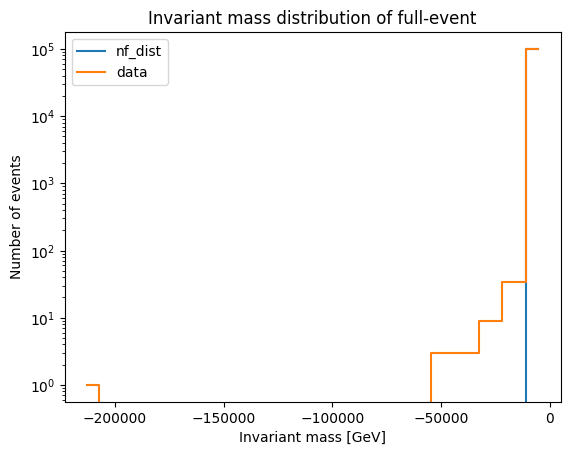

In [20]:
scale = 'log'
min_mass = np.min([np.min(log_probs_data_np_finite),np.min(log_probs_samples_np_finite)])  # lower limit of the binning
max_mass = np.max([np.max(log_probs_data_np_finite),np.max(log_probs_samples_np_finite)])  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(log_probs_samples_np, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(log_probs_data_np, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='nf_dist', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='data', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

In [21]:
np.min(log_probs_samples_np_finite)

-14.247177

In [22]:
np.min(log_probs_data_np_finite)

-218267.33

In [23]:
prova = nf_dist.log_prob(X_data_train_std)
print(prova)
# Get the indices of NaNs
nan_indices = tf.where(prova<10*np.min(log_probs_samples_np_finite)).numpy()
num_nans = len(nan_indices)
# Print the result
print("Number of NaNs: ", num_nans)
print("Indices of NaNs: ", nan_indices)

tf.Tensor(
[  2.775476     2.4878857   -0.63504124 ... -16.23656     -4.361019
  -3.9007823 ], shape=(100000,), dtype=float32)
Number of NaNs:  7677
Indices of NaNs:  [[   17]
 [   33]
 [   38]
 ...
 [99993]
 [99995]
 [99996]]


In [24]:
prova = nf_dist.log_prob(X_data_train_std)
print(prova)
# Check for NaNs
has_nan = tf.math.is_nan(prova)
# Count the number of NaNs
num_nans = tf.math.reduce_sum(tf.cast(has_nan, tf.int32))
# Print the result
print("Number of NaNs: ", num_nans.numpy())
# Get the indices of NaNs
nan_indices = tf.where(has_nan)
# Print the result
print("Indices of NaNs: ", nan_indices.numpy())

tf.Tensor(
[  2.775476     2.4878857   -0.63504124 ... -16.23656     -4.361019
  -3.9007823 ], shape=(100000,), dtype=float32)
Number of NaNs:  0
Indices of NaNs:  []


In [25]:
# Compute mask of non-NaN values
#mask = tf.math.is_finite(prova)
mask = tf.math.greater(prova, 100000*np.min(log_probs_samples_np_finite))
# Use this mask to filter X_data_train_std
X_data_train_std_filtered = tf.boolean_mask(X_data_train_std, mask)
prova = nf_dist.log_prob(X_data_train_std_filtered)
# Check for NaNs
has_nan = tf.math.is_nan(prova)
# Count the number of NaNs
num_nans = tf.math.reduce_sum(tf.cast(has_nan, tf.int32))
# Print the result
print("Number of NaNs: ", num_nans.numpy())
# Get the indices of NaNs
nan_indices = tf.where(has_nan)
# Print the result
print("Indices of NaNs: ", nan_indices.numpy())

Number of NaNs:  0
Indices of NaNs:  []


In [26]:
len(X_data_train_std_filtered)

100000

In [41]:
samples_np = samples.numpy().astype("float32")
samples_np_no_nans = samples_np[~np.isnan(samples_np).any(axis=1), :]
X_data_train_std_np = X_data_train_std_filtered.numpy().astype("float32")
X_data_train_std_np_no_nans = X_data_train_std_np[~np.isnan(X_data_train_std_np).any(axis=1), :]
Lorentz.cornerplotter(X_data_train_std_np,samples_np_no_nans,max_dim=32,n_bins=50)


KeyboardInterrupt



Error in callback <function _draw_all_if_interactive at 0x7ff8f08e8b80> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7ff891f0c5e0> (for post_execute):


KeyboardInterrupt: 

In [27]:
n_epochs = 1000
batch_size = 512

history, training_time = Trainer.graph_execution(ndims = ndims,
                                                 trainable_distribution = nf_dist,
                                                 X_data = X_data_train_std_filtered,
                                                 n_epochs = n_epochs, 
                                                 batch_size = batch_size, 
                                                 n_disp = 1, 
                                                 path_to_results = results_path,
                                                 load_weights = False, 
                                                 lr=.001, 
                                                 patience=30, 
                                                 min_delta_patience=0.001, 
                                                 reduce_lr_factor=0.2, 
                                                 seed=0, 
                                                 stop_on_nan=False)

KerasTensor(type_spec=TensorSpec(shape=(None, 12), dtype=tf.float32, name='input_7'), name='input_7', description="created by layer 'input_7'")
####### log_prob####
KerasTensor(type_spec=TensorSpec(shape=(None,), dtype=tf.float32, name=None), name='tf.__operators__.add_74/AddV2:0', description="created by layer 'tf.__operators__.add_74'")
Epoch 1/1000

 Epoch 1/1000 
	 loss: 2.1658, val_loss: -0.3533

Epoch 00001: val_loss improved from inf to -0.35330, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 25s - loss: 2.1658 - val_loss: -3.5330e-01 - lr: 0.0010 - 25s/epoch - 186ms/step
Epoch 2/1000

 Epoch 2/1000 
	 loss: -0.3801, val_loss: -0.4639

Epoch 00002: val_loss improved from -0.35330 to -0.46391, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 13s - loss: -3.8009e-01 - val_loss: -4.6391e-01 - lr: 0.0010 - 13s/epoch - 93ms/step
Epoch 3/1000

 Epoch 3/1000 
	 loss: -0.4756, val_loss: -0.6114

Epoch 00003: val_loss improv

137/137 - 13s - loss: -1.5845e+00 - val_loss: -1.5021e+00 - lr: 0.0010 - 13s/epoch - 93ms/step
Epoch 33/1000

 Epoch 33/1000 
	 loss: -1.5970, val_loss: -1.6142

Epoch 00033: val_loss improved from -1.50211 to -1.61417, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 12s - loss: -1.5970e+00 - val_loss: -1.6142e+00 - lr: 0.0010 - 12s/epoch - 86ms/step
Epoch 34/1000

 Epoch 34/1000 
	 loss: -1.6615, val_loss: -1.5359

Epoch 00034: val_loss did not improve from -1.61417
137/137 - 12s - loss: -1.6615e+00 - val_loss: -1.5359e+00 - lr: 0.0010 - 12s/epoch - 91ms/step
Epoch 35/1000

 Epoch 35/1000 
	 loss: -1.7186, val_loss: -1.6441

Epoch 00035: val_loss improved from -1.61417 to -1.64406, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 13s - loss: -1.7186e+00 - val_loss: -1.6441e+00 - lr: 0.0010 - 13s/epoch - 94ms/step
Epoch 36/1000

 Epoch 36/1000 
	 loss: -1.2792, val_loss: -1.4870

Epoch 00036: val_loss did not improve from -

Epoch 72/1000

 Epoch 72/1000 
	 loss: nan, val_loss: nan

Epoch 00072: val_loss did not improve from -1.98077
137/137 - 12s - loss: nan - val_loss: nan - lr: 0.0010 - 12s/epoch - 86ms/step
Epoch 73/1000

 Epoch 73/1000 
	 loss: nan, val_loss: nan

Epoch 00073: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.

Epoch 00073: val_loss did not improve from -1.98077
137/137 - 13s - loss: nan - val_loss: nan - lr: 0.0010 - 13s/epoch - 93ms/step
Epoch 74/1000

 Epoch 74/1000 
	 loss: nan, val_loss: nan

Epoch 00074: val_loss did not improve from -1.98077
137/137 - 12s - loss: nan - val_loss: nan - lr: 2.0000e-04 - 12s/epoch - 88ms/step
Epoch 75/1000

 Epoch 75/1000 
	 loss: nan, val_loss: nan

Epoch 00075: val_loss did not improve from -1.98077
137/137 - 12s - loss: nan - val_loss: nan - lr: 2.0000e-04 - 12s/epoch - 85ms/step
Epoch 76/1000

 Epoch 76/1000 
	 loss: nan, val_loss: nan

Epoch 00076: val_loss did not improve from -1.98077
137/137 - 12s - loss: nan - val_loss: n

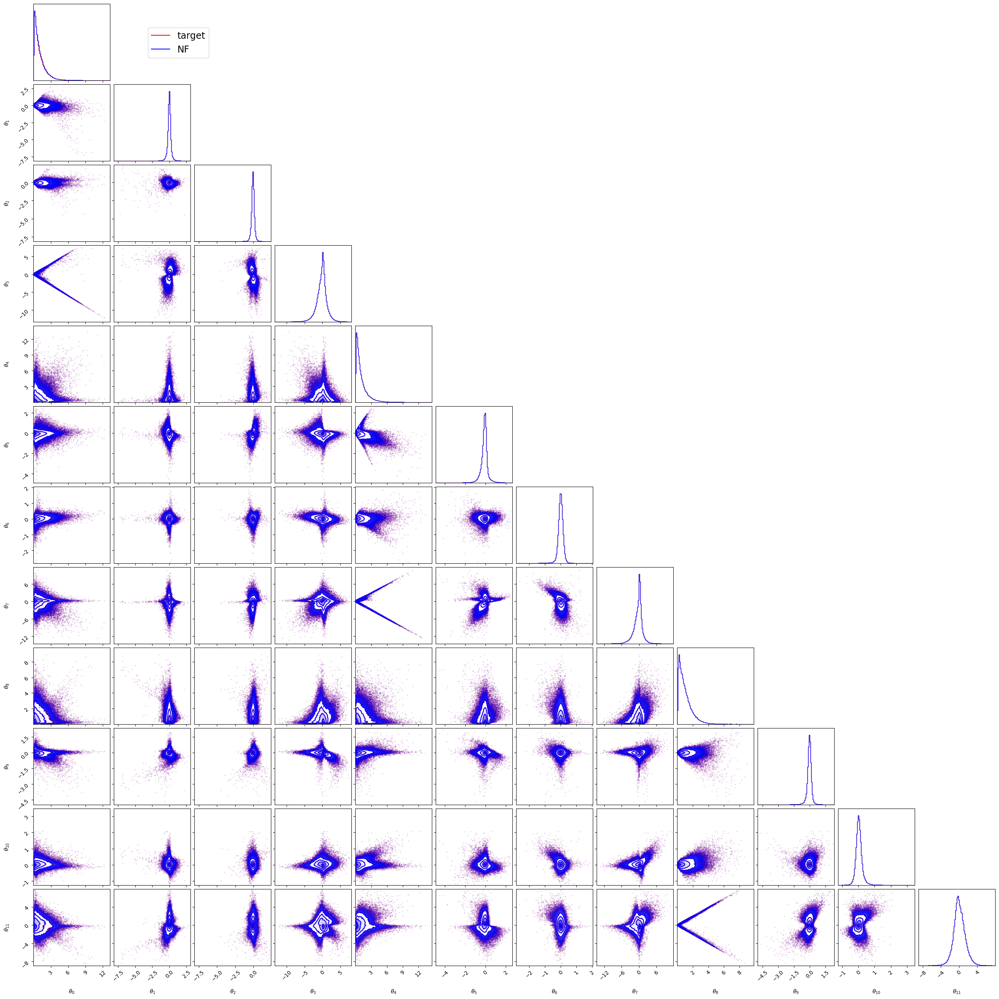

In [28]:
samples = nf_dist.sample(100000)
samples_np = samples.numpy()
Lorentz.cornerplotter(samples_np,samples_np,max_dim=32,n_bins=100)

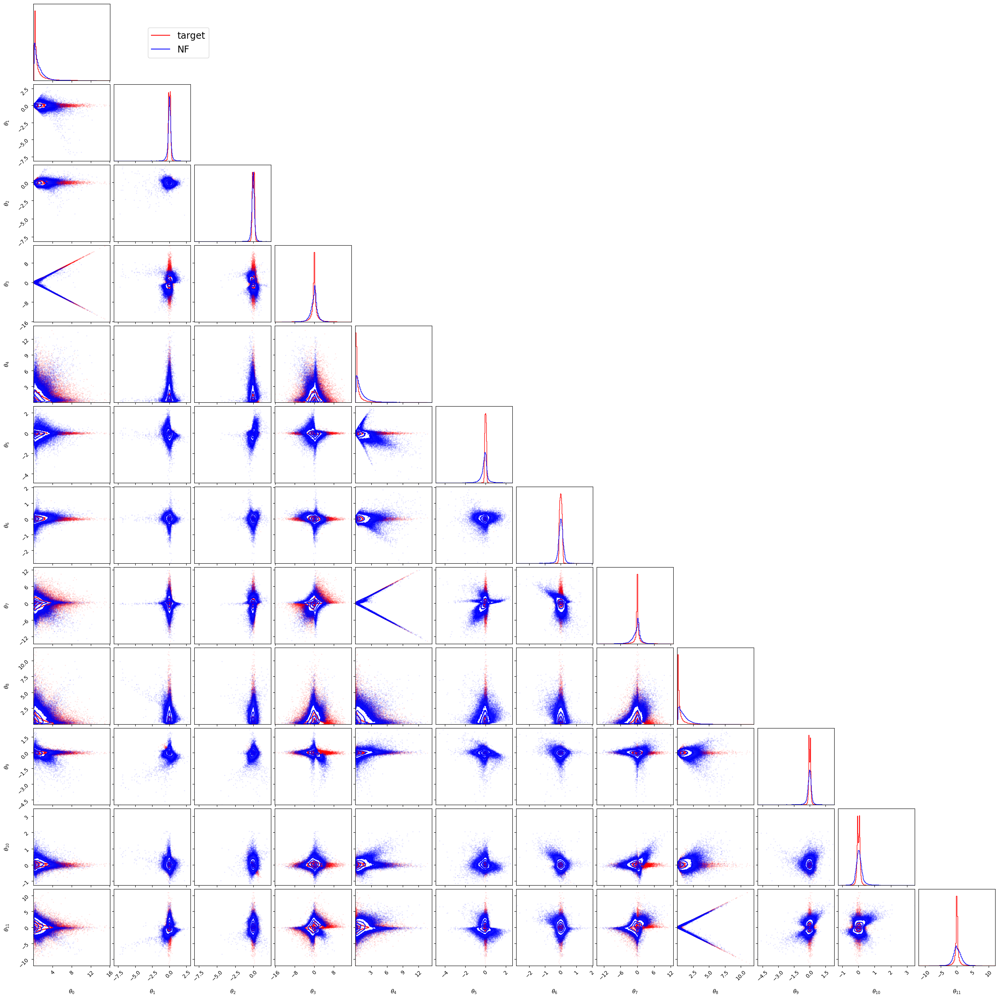

In [29]:
samples_np = samples.numpy()
X_data_train_std_np = X_data_train_std.numpy()
Lorentz.cornerplotter(X_data_train_std_np,samples_np,max_dim=32,n_bins=100)

## Physics plots

In [44]:
X_samples = samples_np_no_nans*(std_energy_0)

In [ ]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Compute the inv masses
Minv_samples = tf.sqrt(tf.reduce_sum(tf.reshape(X_samples,[-1,3,4])[:,:,0],axis=1)**2-tf.reduce_sum(tf.reduce_sum(tf.reshape(X_samples,[-1,3,4])[:,:,1:],axis=1)**2,axis=1))
Minv_data = tf.sqrt(tf.reduce_sum(tf.reshape(X_data_train,[-1,3,4])[:,:,0],axis=1)**2-tf.reduce_sum(tf.reduce_sum(tf.reshape(X_data_train,[-1,3,4])[:,:,1:],axis=1)**2,axis=1))

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(Minv_data, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(Minv_samples, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - data', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - NF', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

In [ ]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Compute the inv masses
Minv_samples = tf.sqrt(tf.reduce_sum(tf.reshape(X_samples,[-1,3,4])[:,:2,0],axis=1)**2-tf.reduce_sum(tf.reduce_sum(tf.reshape(X_samples,[-1,3,4])[:,:2,1:],axis=1)**2,axis=1))
Minv_data = tf.sqrt(tf.reduce_sum(tf.reshape(X_data_train,[-1,3,4])[:,:2,0],axis=1)**2-tf.reduce_sum(tf.reduce_sum(tf.reshape(X_data_train,[-1,3,4])[:,:2,1:],axis=1)**2,axis=1))

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(Minv_data, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(Minv_samples, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - data', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - NF', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$')
plt.legend()
plt.show()

# Model C1 - 3*n_particles bijectors - [64,64,64] - no px=py=0 

Removing very low logprob points by masking at 10 * min(log_prob(samples)) (negative value around -156)

In [3]:
import numpy as np
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow_probability as tfp
import Lorentz

tfd = tfp.distributions
tfb = tfp.bijectors
tfpl = tfp.layers
tfk = tf.keras

In [4]:
with h5py.File(events_dataset, 'r') as hdf:
    # Loads the datasets from events_dataset file
    events = hdf['Z+1j'][:]
len(events)

3987098

In [5]:
nsamples = 100000
ndims = events.shape[1]
X_data_train = tf.convert_to_tensor(events[:nsamples].astype(np.float32))
n_particles = int(X_data_train.shape[1]/4)
# Reshape the data to isolate the energies and momenta
reshaped_data = tf.reshape(X_data_train, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute mean energy
mean_energy_0 = tf.reduce_mean(energies)
median_energy_0 = tfp.stats.percentile(energies, 50.0)
max_energy_0 = tf.reduce_max(energies)
std_energy_0 = tf.math.reduce_std(energies)
# Rescale all 4-momenta components by mean energy
#X_data_train_std = X_data_train/mean_energy
#X_data_train_std = X_data_train/median_energy
#X_data_train_std = X_data_train/max_energy
X_data_train_std = X_data_train/(std_energy_0)
print("Energy_0 (mu,sigma) = ",[mean_energy_0.numpy(),std_energy_0.numpy()])
print("Energy_0 (median,max) = ",[median_energy_0.numpy(),max_energy_0.numpy()])
###
###
# And now compute means3mom and stdev3mom
reshaped_data = tf.reshape(X_data_train_std, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute the means
mean_energy = tf.reduce_mean(energies)
mean_px = tf.reduce_mean(px)
mean_py = tf.reduce_mean(py)
mean_pz = tf.reduce_mean(pz)
# Compute the standard deviations
std_energy = tf.math.reduce_std(energies)
std_px = tf.math.reduce_std(px)
std_py = tf.math.reduce_std(py)
std_pz = tf.math.reduce_std(pz)
# Combine the means and standard deviations of px, py, and pz
means3mom = tf.stack([mean_px, mean_py, mean_pz], axis=-1)
stdev3mom = tf.stack([std_px, std_py, std_pz], axis=-1)
print("Energy_std (mu,sigma) = ",[mean_energy.numpy(),std_energy.numpy()])
print("px_std (mu,sigma) = ",[mean_px.numpy(),std_px.numpy()])
print("py_std (mu,sigma) = ",[mean_py.numpy(),std_py.numpy()])
print("pz_std (mu,sigma) = ",[mean_pz.numpy(),std_pz.numpy()])

Energy_0 (mu,sigma) =  [205.20242, 309.13052]
Energy_0 (median,max) =  [91.29781, 4969.9326]
Energy_std (mu,sigma) =  [0.6638051, 1.0]
px_std (mu,sigma) =  [-4.809603e-05, 0.10849082]
py_std (mu,sigma) =  [-4.3594195e-05, 0.10840782]
pz_std (mu,sigma) =  [0.0008196925, 1.1903805]


In [6]:
base_dist = Lorentz.BaseDistribution4Momenta(n_particles=3,
                                             means3mom=means3mom,
                                             stdev3mom=stdev3mom,
                                             conserve_transverse_momentum=False,
                                             dtype=tf.float32)

In [7]:
samples = base_dist.sample(100000)
log_probs = base_dist.log_prob(samples)
loss_mean = -tf.reduce_mean(log_probs)
loss_max = -tf.reduce_max(log_probs)
[samples,log_probs]
print("A reasonable loss expected from training in range:",[loss_max.numpy(),loss_mean.numpy()])

A reasonable loss expected from training in range: [-4.327967, -0.030685116]


In [8]:
log_probs_samples = base_dist.log_prob(samples)
log_probs_data = base_dist.log_prob(X_data_train_std)
log_probs_samples_np = log_probs_samples.numpy()
log_probs_data_np = log_probs_data.numpy()

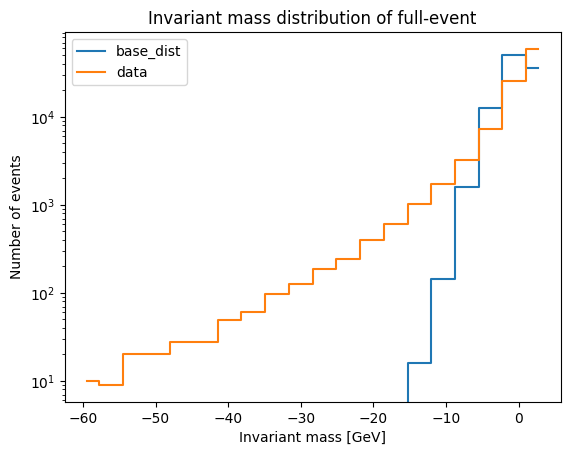

In [9]:
scale = 'log'
min_mass = np.min([np.min(log_probs_data_np),np.min(log_probs_samples_np)])/4  # lower limit of the binning
max_mass = np.max([np.max(log_probs_data_np),np.max(log_probs_samples_np)])  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(log_probs_samples_np, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(log_probs_data_np, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='base_dist', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='data', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

In [10]:
#samples_np = samples.numpy().astype("float32")
#samples_np_no_nans = samples_np[~np.isnan(samples_np).any(axis=1), :]
#X_data_train_std_np = X_data_train_std.numpy().astype("float32")
#X_data_train_std_np_no_nans = X_data_train_std_np[~np.isnan(X_data_train_std_np).any(axis=1), :]
#Lorentz.cornerplotter(X_data_train_std_np,samples_np_no_nans,max_dim=32,n_bins=50)

In [11]:
prova = base_dist.log_prob(X_data_train_std)
print(prova)
# Check for NaNs
has_nan = tf.math.is_nan(prova)
# Count the number of NaNs
num_nans = tf.math.reduce_sum(tf.cast(has_nan, tf.int32))
# Print the result
print("Number of NaNs: ", num_nans.numpy())

tf.Tensor(
[ 2.4041743   2.5434866   1.8106437  ... -1.9121575   0.74970865
  1.3094423 ], shape=(100000,), dtype=float32)
Number of NaNs:  0


In [12]:
n_particles = X_data_train_std.shape[1]//4
n_bijectors = 3*n_particles
hidden_units = [64, 64, 64]
activation = 'relu'

flow = Lorentz.GeneralLorentzNormalizingFlow(n_particles = n_particles, 
                                             n_bijectors = n_bijectors, 
                                             hidden_units = hidden_units, 
                                             activation = activation,
                                             conserve_transverse_momentum=False,
                                             dtype = tf.float32,
                                             permute_only = False)

In [13]:
nf_dist = tfd.TransformedDistribution(base_dist,flow)

In [14]:
nf_dist.log_prob(X_data_train_std[4:5])

<tf.Tensor: shape=(1,), dtype=float32, numpy=array([-18.0548], dtype=float32)>

In [15]:
#x = base_dist.sample(4)
x = X_data_train_std[4:5]
print("========================")
print(x)
print(Lorentz.check_4momentum_conservation(x))
print(Lorentz.compute_masses(x))
print(nf_dist.log_prob(x))

print("\n========================")
y = flow.forward(x)
print(y)
print(Lorentz.check_4momentum_conservation(y))
print(Lorentz.compute_masses(y))
print(nf_dist.log_prob(y))

print("\n========================")
x_back = flow.inverse(y)
print(x_back)
print(Lorentz.check_4momentum_conservation(x_back))
print(Lorentz.compute_masses(x_back))
print(nf_dist.log_prob(x_back))

tf.Tensor(
[[ 0.33985204  0.08613911 -0.15189867 -0.29155833  0.9229405  -0.00684276
  -0.01169635 -0.922841    0.87087435 -0.09793969  0.12045137 -0.8567176 ]], shape=(1, 12), dtype=float32)
The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': False, 'momentum_y': False, 'momentum_z': False}}
The event contains 1 particles
Computing masses from on-shell condition
{'event:0': array([0.        , 0.        , 0.01887635], dtype=float32)}
tf.Tensor([-18.0548], shape=(1,), dtype=float32)

tf.Tensor(
[[ 0.35790825  0.12033571 -0.21202892 -0.26203308  1.0342448   0.6678256
  -0.18959492 -0.7666322   0.8408308  -0.21202935  0.0836544  -0.80912644]], shape=(1, 12), dtype=float32)
The event contains 1 particles
Checking energy-momentum conservation for each event...
{'event:0': {'energy': False, 'momentum_x': False, 'momentum_y': False, 'momentum_z': False}}
The event contains 1 particles
Computing masses from on-shell

In [16]:
samples = nf_dist.sample(100000)
log_probs = nf_dist.log_prob(samples)
[samples,log_probs]

[<tf.Tensor: shape=(100000, 12), dtype=float32, numpy=
 array([[ 0.5788228 ,  0.38980442,  0.00262517, ...,  0.2469675 ,
         -0.02470926,  1.6752422 ],
        [ 0.934271  ,  0.08357549, -0.04695931, ..., -0.04371358,
          0.04834193, -0.28052425],
        [ 1.0815601 ,  0.4121264 ,  0.06127088, ...,  0.15376385,
          0.24773246, -0.17025545],
        ...,
        [ 0.30158985, -0.0989581 ,  0.12179618, ..., -0.06324649,
          0.10897981, -0.03570104],
        [ 0.89566255, -0.1624147 ,  0.15906277, ..., -0.0224811 ,
          0.01182056,  0.31538472],
        [ 0.77560186, -0.0097184 ,  0.01317144, ..., -0.15698983,
         -0.12324835, -0.30753958]], dtype=float32)>,
 <tf.Tensor: shape=(100000,), dtype=float32, numpy=
 array([ 1.8629446 , -0.50843906, -0.5079148 , ...,  2.0911763 ,
         2.1613145 ,  1.6982858 ], dtype=float32)>]

In [17]:
log_probs_samples = nf_dist.log_prob(samples)
log_probs_data = nf_dist.log_prob(X_data_train_std)
log_probs_samples_np = log_probs_samples.numpy()
#log_probs_samples_np = log_probs_samples_np[~np.isnan(log_probs_samples_np)]
log_probs_data_np = log_probs_data.numpy()
#log_probs_data_np = log_probs_data_np[~np.isnan(log_probs_data_np)]
log_probs_data_np_finite = log_probs_data_np[np.isfinite(log_probs_data_np)]
log_probs_samples_np_finite = log_probs_samples_np[np.isfinite(log_probs_samples_np)]

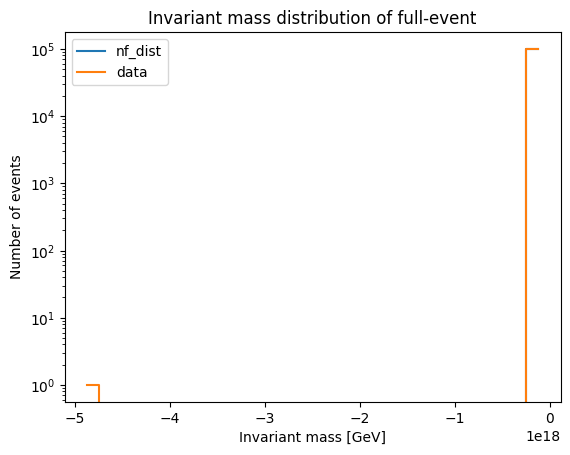

In [18]:
scale = 'log'
min_mass = np.min([np.min(log_probs_data_np_finite),np.min(log_probs_samples_np_finite)])  # lower limit of the binning
max_mass = np.max([np.max(log_probs_data_np_finite),np.max(log_probs_samples_np_finite)])  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(log_probs_samples_np, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(log_probs_data_np, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='nf_dist', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='data', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

In [19]:
print("Minimum sample log_prob = ",np.min(log_probs_samples_np_finite))
print("Minimum data log_prob = ",np.min(log_probs_data_np_finite))

Minimum sample log_prob =  -13.371662
Minimum data log_prob =  -4.9933793e+18


In [20]:
threshold = 1000000000*np.min(log_probs_samples_np_finite)

In [21]:
prova = nf_dist.log_prob(X_data_train_std)
print(prova)
# Get the indices of NaNs
indices_nan = tf.where(tf.math.is_nan(prova)).numpy()
num_nan = len(indices_nan)
#
indices_under_threshold = tf.where(prova<threshold).numpy()
num_under_threshold = len(indices_under_threshold)
#
print("Number of NaNs: ", num_nan)
print("Indices of NaNs: ", indices_nan)
# Print the result
print("Number under threshold: ", num_under_threshold)
print("Indices under threshold: ", indices_under_threshold)

tf.Tensor([ 3.4012456  2.5682619  1.6638899 ... -5.5606585  1.7408309  1.8395262], shape=(100000,), dtype=float32)
Number of NaNs:  0
Indices of NaNs:  []
Number under threshold:  17
Indices under threshold:  [[ 2924]
 [ 7828]
 [14293]
 [23041]
 [24027]
 [26788]
 [29038]
 [29847]
 [41162]
 [48077]
 [56891]
 [58917]
 [67144]
 [69139]
 [71410]
 [78762]
 [87091]]


In [22]:
#forward = lorentz_boost(0.52015775, 3.1801455, 3.0476844)
#forward
#inverse = lorentz_boost(-0.52015775, 3.1801455, 3.0476844)
#inverse
#tf.matmul(forward,inverse)

In [23]:
#y0 = X_data_train_std[244:245]
#y = y0
#print("Event: ",y)
#print("Event logprob: ",nf_dist.log_prob(y))
#for bijector in flow.bijectors:
#    print("----------------------------------")
#    print("Applying bijector: ", bijector.name)
#    if "GeneralLorentzTransformBijector" in bijector.name:
#        parameters = bijector.nn(y[:,:4])
#        beta = parameters[..., 0]  # Velocity for boost in the x direction (ranges from -1 to 1). shape (n_samples,)
#        theta = parameters[..., 1]  # Polar angle for boost in the x direction (ranges from 0 to pi). shape (n_samples,)
#        phi = parameters[..., 2]  # Azimuthal angle for boost in the x direction (ranges from 0 to 2*pi). shape (n_samples,)
#        theta_1 = parameters[..., 3]  # Euler angle 1: rotation around z-axis. shape (n_samples,)
#        theta_2 = parameters[..., 4]  # Euler angle 2: rotation around y-axis. shape (n_samples,)
#        theta_3 = parameters[..., 5]  # Euler angle 3: rotation around new z-axis. shape (n_samples,)
#        boost_matrix = Lorentz.lorentz_boost(-beta, theta, phi, dtype=y.dtype)  # shape: (n_samples, 4, 4)
#        rotation_matrix = Lorentz.euler_rotation(-theta_3, -theta_2, -theta_1, dtype=y.dtype)  # shape: (n_samples, 4, 4)
#        print("Parameters: ", parameters)
#        print("Lorentz boost: ",boost_matrix)
#        print("Euler rotation: ",rotation_matrix)
#    x = bijector.inverse(y)
#    print("Event: ", x)
#    print("Inverse log det jacobian: ", bijector.inverse_log_det_jacobian(y, event_ndims=1))
#    y = x
#print("----------------------------------")
#print("Final event: ", x)
#print("Base distribution log prob: ", base_dist.log_prob(x))
#print("----------------------------------")
#print("Final event in one pass: ", flow.inverse(y0))

In [24]:
# Compute mask of non-NaN values
tmp = nf_dist.log_prob(X_data_train_std)
mask_finite = tf.math.is_finite(tmp)
X_data_train_std_masked_1 = tf.boolean_mask(X_data_train_std, mask_finite)
deleted = len(X_data_train_std)-len(X_data_train_std_masked_1)
print("Deleted",deleted,"points containing nans")
tmp = nf_dist.log_prob(X_data_train_std_masked_1)
mask_above_threshold = tf.math.greater(tmp, threshold)
X_data_train_std_filtered = tf.boolean_mask(X_data_train_std_masked_1, mask_above_threshold)
deleted = len(X_data_train_std_masked_1)-len(X_data_train_std_filtered)
print("Deleted",deleted,"points below threshold",threshold)
print("Remaining points:",len(X_data_train_std_filtered))
# Check
prova = nf_dist.log_prob(X_data_train_std_filtered)
# Check for NaNs
indices_nan_new = tf.where(tf.math.is_nan(prova)).numpy()
num_nan_new = len(indices_nan_new)
# Print the result
print("Number of NaNs: ", num_nan_new)
print("Indices of NaNs: ", indices_nan_new)

Deleted 0 points containing nans
Deleted 17 points below threshold -13371662139.892578
Remaining points: 99983
Number of NaNs:  0
Indices of NaNs:  []


In [25]:
#samples_np = samples.numpy().astype("float32")
#samples_np_no_nans = samples_np[~np.isnan(samples_np).any(axis=1), :]
#X_data_train_std_np = X_data_train_std_filtered.numpy().astype("float32")
#X_data_train_std_np_no_nans = X_data_train_std_np[~np.isnan(X_data_train_std_np).any(axis=1), :]
#Lorentz.cornerplotter(X_data_train_std_np,samples_np_no_nans,max_dim=32,n_bins=50)

In [ ]:
n_epochs = 1000
batch_size = 512

history, training_time = Lorentz.graph_execution(ndims = ndims,
                                                 trainable_distribution = nf_dist,
                                                 X_data = X_data_train_std_filtered,
                                                 n_epochs = n_epochs, 
                                                 batch_size = batch_size, 
                                                 n_disp = 1, 
                                                 path_to_results = results_path,
                                                 load_weights = False, 
                                                 lr=.001, 
                                                 patience=30, 
                                                 min_delta_patience=0.001, 
                                                 reduce_lr_factor=0.2, 
                                                 seed=0, 
                                                 stop_on_nan=True)

KerasTensor(type_spec=TensorSpec(shape=(None, 12), dtype=tf.float32, name='input_10'), name='input_10', description="created by layer 'input_10'")
####### log_prob####
KerasTensor(type_spec=TensorSpec(shape=(None,), dtype=tf.float32, name=None), name='log_prob_layer/ParticleBoostedNormalizingFlowBaseDistribution4Momenta/log_prob/add:0', description="created by layer 'log_prob_layer'")


2023-06-16 16:48:04.192576: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


Epoch 1/1000


2023-06-16 16:48:21.290959: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_9/log_prob_layer/ParticleBoostedNormalizingFlowBaseDistribution4Momenta/log_prob/ParticleBoostedNormalizingFlow_2/inverse_log_det_jacobian/assert_equal_1/Assert/AssertGuard/branch_executed/_9
2023-06-16 16:48:47.893074: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_9/log_prob_layer/ParticleBoostedNormalizingFlowBaseDistribution4Momenta/log_prob/ParticleBoostedNormalizingFlow_2/inverse_log_det_jacobian/assert_equal_1/Assert/AssertGuard/branch_executed/_9



 Epoch 1/1000 
	 loss: 21718501376.0000, val_loss: 11.5869

Epoch 00001: val_loss improved from inf to 11.58685, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 48s - loss: 21718501376.0000 - val_loss: 11.5869 - lr: 0.0010 - 48s/epoch - 354ms/step
Epoch 2/1000

 Epoch 2/1000 
	 loss: 6.3521, val_loss: 9.2526

Epoch 00002: val_loss improved from 11.58685 to 9.25258, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 25s - loss: 6.3521 - val_loss: 9.2526 - lr: 0.0010 - 25s/epoch - 184ms/step
Epoch 3/1000

 Epoch 3/1000 
	 loss: 5.4482, val_loss: 8.0131

Epoch 00003: val_loss improved from 9.25258 to 8.01315, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 25s - loss: 5.4482 - val_loss: 8.0131 - lr: 0.0010 - 25s/epoch - 184ms/step
Epoch 4/1000

 Epoch 4/1000 
	 loss: 4.9533, val_loss: 4.8969

Epoch 00004: val_loss improved from 8.01315 to 4.89695, saving model to ../ZplusJets/results/Lorentz/mode

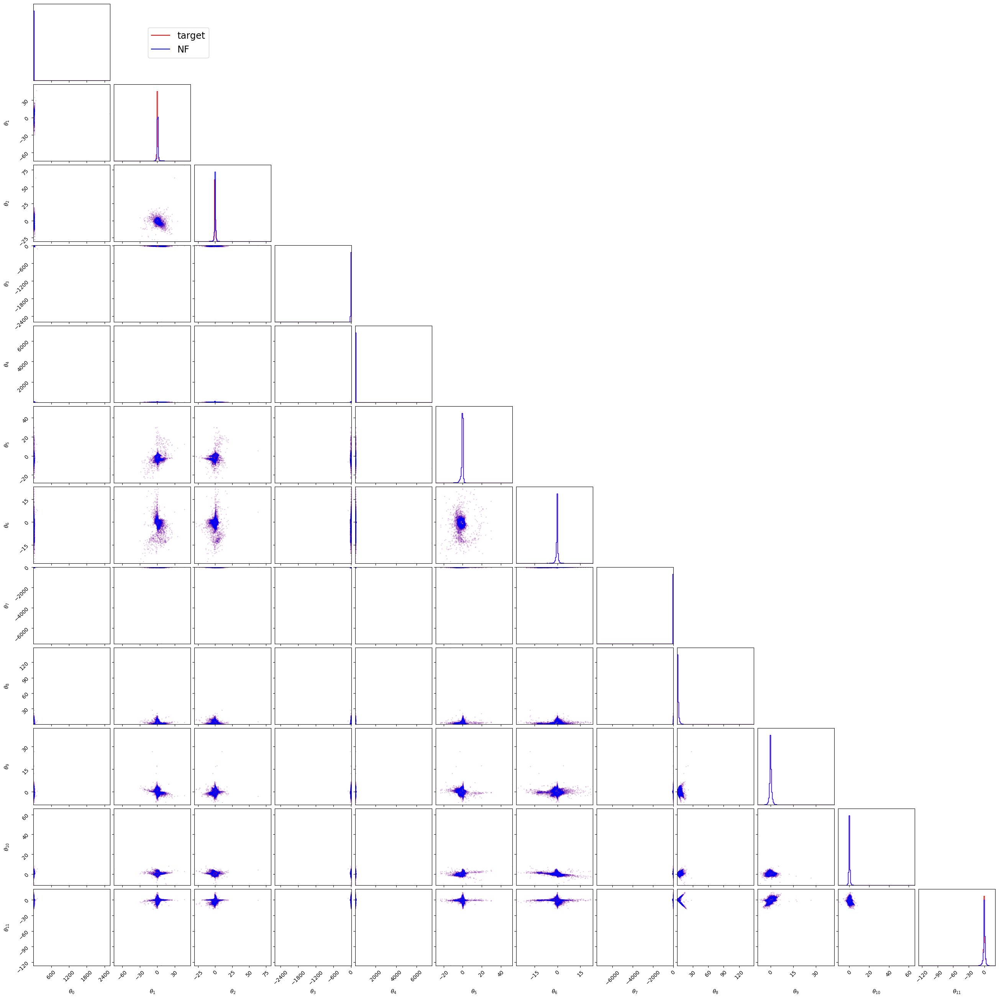

In [27]:
samples = nf_dist.sample(100000)
samples_np = samples.numpy().astype("float32")
samples_np_no_nans = samples_np[~np.isnan(samples_np).any(axis=1), :]
Lorentz.cornerplotter(samples_np_no_nans,samples_np_no_nans,max_dim=32,n_bins=100)

In [37]:
len(samples_np_no_nans)

99926

In [43]:
samples_np_no_nans

array([[ 0.76709795,  0.04155864, -0.7589258 , ...,  8.943942  ,
        11.752907  ,  5.8858776 ],
       [ 2.1717587 ,  1.802083  , -0.11807375, ..., -0.1499452 ,
        -0.78377336, -0.3155513 ],
       [ 2.8603394 , -1.4112874 , -1.4654409 , ..., -0.03975582,
        -0.03807552,  0.01288784],
       ...,
       [ 0.91826105,  0.154126  , -0.49229568, ..., -5.4578514 ,
        -0.9577209 , -7.719474  ],
       [ 7.2782383 , -6.200301  ,  1.4042326 , ...,  0.1914473 ,
         0.9705564 , -4.033861  ],
       [ 0.19974422, -0.16237824, -0.10422649, ...,  1.18939   ,
         1.7020254 , -0.6130221 ]], dtype=float32)

In [ ]:
X_data_train_std_np = X_data_train_std.numpy()
Lorentz.cornerplotter(X_data_train_std_np,samples_np_no_nans,max_dim=32,n_bins=100)

## Physics plots

In [44]:
X_samples = samples_np_no_nans*(std_energy_0)

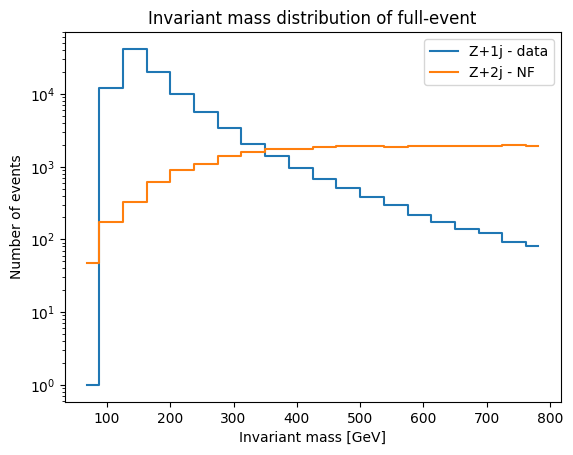

In [45]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Compute the inv masses
Minv_samples = tf.sqrt(tf.reduce_sum(tf.reshape(X_samples,[-1,3,4])[:,:,0],axis=1)**2-tf.reduce_sum(tf.reduce_sum(tf.reshape(X_samples,[-1,3,4])[:,:,1:],axis=1)**2,axis=1))
Minv_data = tf.sqrt(tf.reduce_sum(tf.reshape(X_data_train,[-1,3,4])[:,:,0],axis=1)**2-tf.reduce_sum(tf.reduce_sum(tf.reshape(X_data_train,[-1,3,4])[:,:,1:],axis=1)**2,axis=1))

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(Minv_data, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(Minv_samples, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - data', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - NF', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

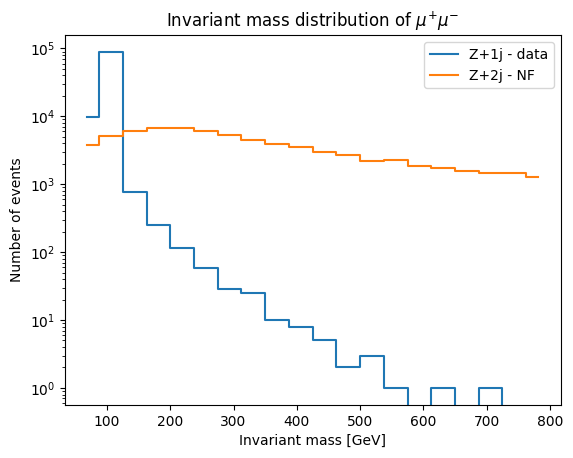

In [46]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Compute the inv masses
Minv_samples = tf.sqrt(tf.reduce_sum(tf.reshape(X_samples,[-1,3,4])[:,:2,0],axis=1)**2-tf.reduce_sum(tf.reduce_sum(tf.reshape(X_samples,[-1,3,4])[:,:2,1:],axis=1)**2,axis=1))
Minv_data = tf.sqrt(tf.reduce_sum(tf.reshape(X_data_train,[-1,3,4])[:,:2,0],axis=1)**2-tf.reduce_sum(tf.reduce_sum(tf.reshape(X_data_train,[-1,3,4])[:,:2,1:],axis=1)**2,axis=1))

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(Minv_data, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(Minv_samples, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - data', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - NF', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$')
plt.legend()
plt.show()

# Other